In [2]:
library('igraph')
library('Matrix')
library('pracma')
library('data.table')

library(ggplot2)



Attaching package: ‘igraph’

The following objects are masked from ‘package:stats’:

    decompose, spectrum

The following object is masked from ‘package:base’:

    union

Warning message:
“package ‘pracma’ was built under R version 3.5.0”
Attaching package: ‘pracma’

The following objects are masked from ‘package:Matrix’:

    expm, lu, tril, triu



In [36]:
# helper methods
create_transition_matrix = function (g){
    
    # WARNING: make sure your graph is connected (you might input GCC of your graph)
    
    vs = V(g)
    n = vcount(g)
    adj = as_adjacency_matrix(g)
    adj[diag(rowSums(adj) == 0)] = 1  # handle if the user is using the function for networks with isolated nodes by creating self-edges
    z = matrix(rowSums(adj, , 1))
    
    transition_matrix = adj / repmat(z, 1, n)  # normalize to get probabilities
    
    return(transition_matrix)
}

random_walk = function (g, num_steps, start_node, transition_matrix = NULL, teleport = 0,
                       teleport_type="uniform",pr = NULL, medians=NULL){
  visited_nodes = rep(0,num_steps)
  if(is.null(transition_matrix))
    transition_matrix = create_transition_matrix(g)
  
  v = start_node
  for(i in 1:num_steps){
    #fprintf('Step %d: %d\n', i, v)  # COMMENT THIS
    if (runif(1) < teleport) {
        if (teleport_type == "uniform") {
            v = sample(1:vcount(g),1)
        }
        else if (teleport_type == "pagerank") {
            v = sample(1:vcount(g),1,prob = pr)
        }
        else if (teleport_type == "median") {
            v = sample(medians,1)
        }
        else {
            print("Error with teleport_type. Exiting code")
            quit()
        }
        
    }
    else {
        PMF = transition_matrix[v, ]
        v = sample(1:vcount(g), 1, prob = PMF)
    }
    visited_nodes[i] = v
  }
  
  return(visited_nodes)
}

# 1(a,b)
er_rand = function(p, n=1000, repeats = 1000){
    # we're predicting that since these graphs are randomly generated.. 
    # we want to see if it's not connected given 1000 repeats. (should be sufficient)
    set.seed(0)
    g1 = sample_gnp(n, p=p, directed = F)
    
    counter = 0
    check_connected = TRUE
    for (i in 1:repeats){
        g = sample_gnp(n, p=p, directed = F)
        g_connected = is_connected(g)
        
        if (isTRUE(g_connected)){# connected
            counter = counter + 1
        }
        else { # not connected
            check_connected = FALSE
            unconnected_g = g
        }
    }
    
    print('Problem 1.1a')
    plot(g1, edge.arrow.size=.1, vertex.size=4, vertex.label=NA)
    
    unique_degrees = unique(sort(degree(g1)))
    if (unique_degrees[1]!=0) {
        unique_degrees = seq(0,max(unique_degrees))
    }
    dd = degree_distribution(g1)
#     print(unique_degrees)
#     print(dd)
#     print(length(unique_degrees))
#     print(length(dd))
    plot(unique_degrees,dd, main=paste("Degree distribution: p = ", p),xlab="Degree",ylab="Relative Frequency Vertices")
    lines(seq(0,150, by=1),dbinom(seq(0,150, by=1),n,p), col = 'blue')

    print(paste("Mean: ", mean(degree(g1))))
    print(paste("Variance: ", var(degree(g1))))
    
    print('Problem 1.1b')
    print(paste("All connected: ", check_connected))
    
    # estimated probability that a generated network is connected
    print(paste("Estimated probability that generated connected network:", counter / repeats))
    # If the entire graph isn't connected, find the component with the biggest size and just take that component, dg
    if(check_connected == FALSE){
        dg = decompose(unconnected_g, min.vertices = max(clusters(unconnected_g)$csize))
        plot(dg[[1]], edge.arrow.size=.1, vertex.size=4, vertex.label=NA)
        print(paste("Diameter of GCC: ", diameter(dg[[1]])))
    }
}


er_create_100_random_networks = function(n=1000){
    print('Problem 1.1c')

    cum_gcc_sizes = c()
    x = seq(from=0.004, to=0.011, by=0.0001)
    for (p in x){
        temp_max_components = c()
        for (i in 1:100){# create 100 networks
            g = erdos.renyi.game(n, p=p, directed = F)
            temp_max_components = c(temp_max_components,max(components(g)$csize))
        }

        cum_gcc_sizes = c(cum_gcc_sizes,mean(temp_max_components)/n) # calculate mean of max components
    }

    plot(x, cum_gcc_sizes, main="GCC fraction vs p",xlab="p",ylab="GCC sizes")
}

# 1(d)
average_expected_gcc_size = function(x = seq(from=100, to=10000, by=1)){
    cum_gcc_sizes = c()
    
    c = 0.5
    for (n in x){
        temp_max_components = c()
        for (i in 1:100){
            g = sample_gnp(n, p=c/n, directed = F)
            temp_max_components = c(temp_max_components,max(components(g)$csize))
        }
        cum_gcc_sizes = c(cum_gcc_sizes,mean(temp_max_components))
    }
    
    print('Problem 1.1d(i)')
    plot(x, cum_gcc_sizes , main=paste("GCC size vs n with c= ", c),xlab="n",ylab="GCC sizes")
    
    c = 1
    cum_gcc_sizes_1 = c()

    for (n in x){
        temp_max_components = c()
        for (i in 1:100){
            g = sample_gnp(n, p=c/n, directed = F)
            temp_max_components = c(temp_max_components,max(components(g)$csize))
        }
        cum_gcc_sizes_1 = c(cum_gcc_sizes_1,mean(temp_max_components))
    }
    
    print('Problem 1.1d(ii)')
    plot(x, cum_gcc_sizes_1 , main=paste("GCC size vs n with c= ", c),xlab="n",ylab="GCC sizes")

    
    print('Problem 1.1d(iii)')    
    c = 1.1
    cum_gcc_sizes_2 = c()

    for (n in x){
        temp_max_components = c()
        for (i in 1:100){
            g = sample_gnp(n, p=c/n, directed = F)
            temp_max_components = c(temp_max_components,max(components(g)$csize))
        }
        cum_gcc_sizes_2 = c(cum_gcc_sizes_2,mean(temp_max_components))
    }
        
    c = 1.2
    cum_gcc_sizes_3 = c()

    for (n in x){
        temp_max_components = c()
        for (i in 1:100){
            g = sample_gnp(n, p=c/n, directed = F)
            temp_max_components = c(temp_max_components,max(components(g)$csize))
        }
        cum_gcc_sizes_3 = c(cum_gcc_sizes_3,mean(temp_max_components))
    }    
    
    c = 1.3
    cum_gcc_sizes_4 = c()

    for (n in x){
        temp_max_components = c()
        for (i in 1:100){
            g = sample_gnp(n, p=c/n, directed = F)
            temp_max_components = c(temp_max_components,max(components(g)$csize))
        }
        cum_gcc_sizes_4 = c(cum_gcc_sizes_4,mean(temp_max_components))
    }
    
    plot(x, cum_gcc_sizes_2 , main="GCC size vs n with c=1.1, 1.2, 1.3",xlab="n",ylab="GCC sizes", col='black')
    points(x, cum_gcc_sizes_3, col='red')
    points(x, cum_gcc_sizes_4, col='blue')
    legend("topleft", c("c=1.1","c=1.2", "c=1.3"),
       col=c("black","red","blue"), pch=c(16,16,16))
}

pa_fast_greedy = function(g,n, type='cluster_fast_greedy'){
    if(type == 'walktrap'){
        cs = cluster_walktrap(g)
    }
    else {
        cs = cluster_fast_greedy(g)
    }
    layout = layout_with_fr(g)
    
    plot(cs, g, layout = layout, edge.arrow.size=.1, vertex.size=4, vertex.label=NA, main=paste("n = ", n))
    print(paste("Modularity: ", modularity(g, membership(cs))))
    print(paste("Connected: ", is_connected(g)))
}

#2(b)
# pa_fast_greedy = function(g, n, type='cluster_fast_greedy'){
#     if(type == 'walktrap'){
#         cs = cluster_walktrap(g)
#     }
#     else {
#         cs = cluster_fast_greedy(g)
#     }
    
#     fast_greedy = cluster_fast_greedy(g)
#         layout = layout_with_fr(g)

#     plot(g, mark.groups=groups(fast_greedy), edge.arrow.size=.1, vertex.size=4, vertex.label=NA, main=paste("n = ", n))
#     print(paste("Modularity: ", modularity(fast_greedy)))
#     print(paste("No. of Communities: ", length(fast_greedy)))
#     print(paste("Connected: ", is_connected(g)))
# }


log_distribution_graph = function(g, n, m=1) {
    # plot degree distribution in log-log scale 
    log_degree <- log(c(1:length(degree.distribution(g))))
    log_distr <- log(degree.distribution(g))
    df <- data.frame(log_degree, log_distr)
    plot(log_degree, log_distr, type="o", main=paste("Degree Distribution of the Network in Log Scale (n=",n,", m=",m,")"),xlab="log(degree)",ylab="log(possibility)")
}


# 2(e)
pa_rand_node_dd = function(g, n, m=1) {
    degree_of_j = c()
   
    for (i in 1:vcount(g)) {
            # Random node i
            rand_node_i = sample(vcount(g), 1)
            rand_node_i_neighbors = neighbors(g, rand_node_i)
            # Check if i has a neighbors
            if (length(rand_node_i_neighbors) > 0) {
                # Pick neighbor
                rand_node_j = sample(length(rand_node_i_neighbors), 1)
                # Get degrees of j
                degree_of_j = c(degree_of_j, degree(g, rand_node_i_neighbors[rand_node_j]))
            }
        }
        # Turn it into a table of frequencies for each degree number
        # Turn into amount over total nodes so it looks like degree_distribution()
        dd = as.data.frame(table(degree_of_j))

        # Nguyen: Not sure about this distribution either. How's my logic?
            # calculate P for each degree
        log_degree = log(as.numeric(dd$degree_of_j))
        log_distr = log(as.numeric(dd$Freq))

        plot(log_degree, log_distr, type="o", main=paste("Random Degree Distribution in Log Scale (n=",n,", m=",m,")",collapse=""),xlab="log(degree)",ylab="log(possibility)")

        # TODO: How does this differ from the node degree distribution?
}


evaluate_page_rank = function(g, numsteps, numiterations, teleportProbability, teleportType) {
    # Get the number of steps that need to pass before graph is in "steady state"
    steadyStateSteps = ceiling(log(vcount(g)))
    
    # Initialize the vector that stores the counts of each node after steady state
    visitedCounts = rep(0,vcount(g))
    
    # Have a vector to store the index of each node
    indexList = seq(from=1,to=vcount(g))
    
    # Get the transition matrix
    transitionMatrix = create_transition_matrix(g)
    
    # Page rank 
    pagerank = page_rank(g)
    pagerank = pagerank$vector
    sortedPagerank = order(pagerank)
    prMedians = c(sortedPagerank[floor(vcount(g)/2)], sortedPagerank[floor(vcount(g)/2)+1])

    for (i in 1:numiterations) {
        visitedNodes = random_walk(g,start=sample(indexList,1),num_steps=numsteps,transitionMatrix,
                                  teleport=teleportProbability,teleport_type=teleportType,pr=pagerank,
                                  medians=prMedians)
        for (j in 1:length(visitedNodes)) {
            if (j > steadyStateSteps) {
                visitedCounts[visitedNodes[j]] = visitedCounts[visitedNodes[j]] + 1
            }
        }
    }
    nodeProbabilities = visitedCounts / ((numsteps-steadyStateSteps) * numiterations)
    return(nodeProbabilities)
}



In [3]:
# 1. Generating Random Networks

[1] "Problem 1.1a"


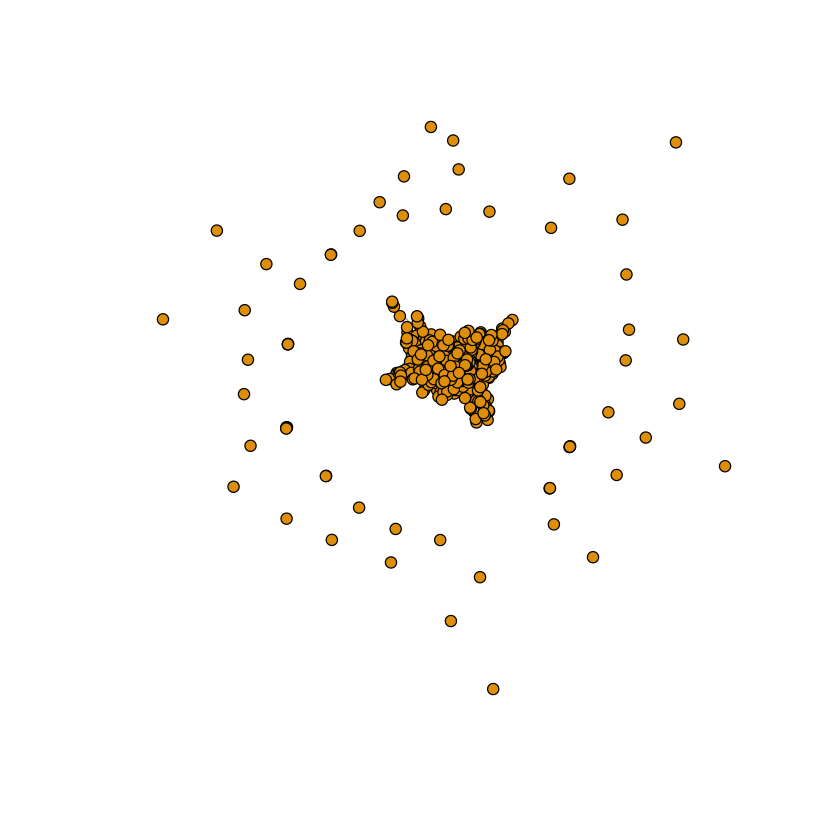

[1] "Mean:  3.122"
[1] "Variance:  3.30842442442442"
[1] "Problem 1.1b"
[1] "All connected:  FALSE"
[1] "Estimated probability that generated connected network: 0"


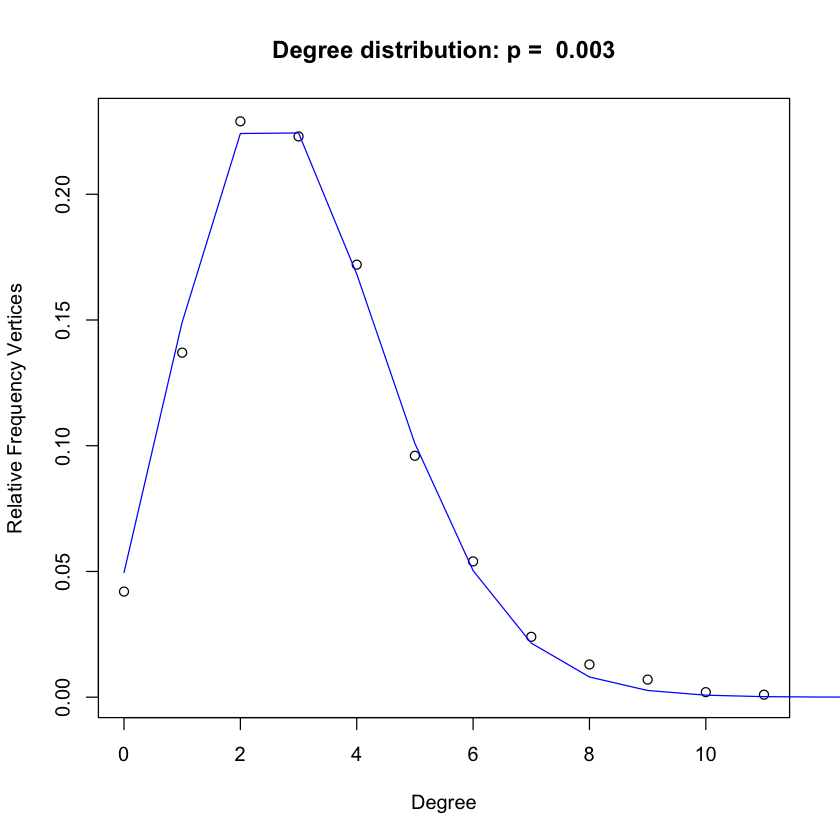

[1] "Diameter of GCC:  14"


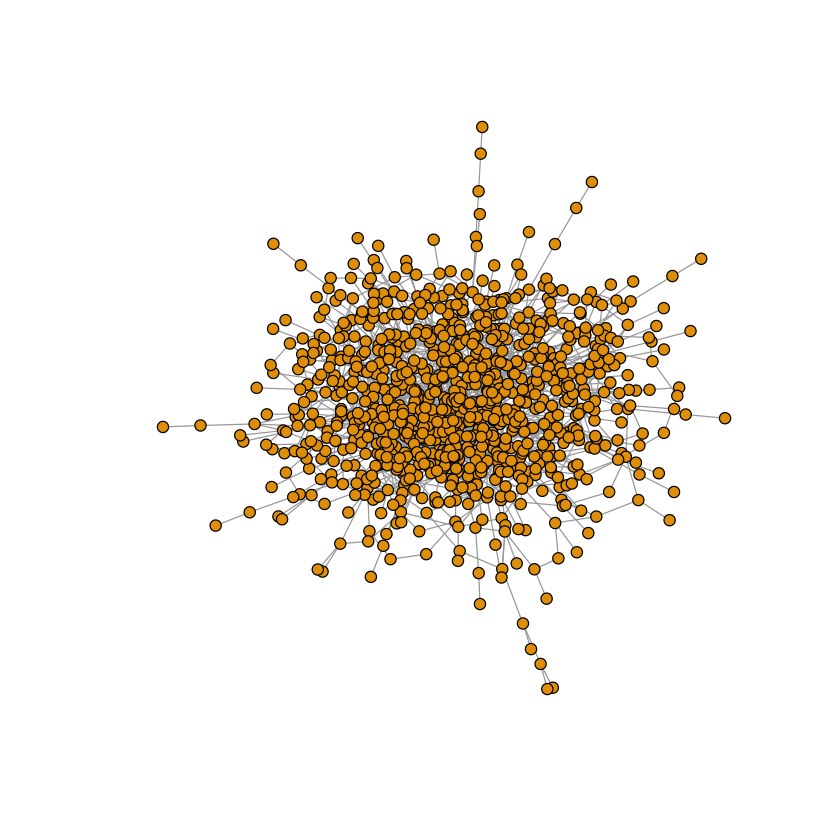

In [4]:
g1 = er_rand(p = 0.003)

[1] "Problem 1.1a"


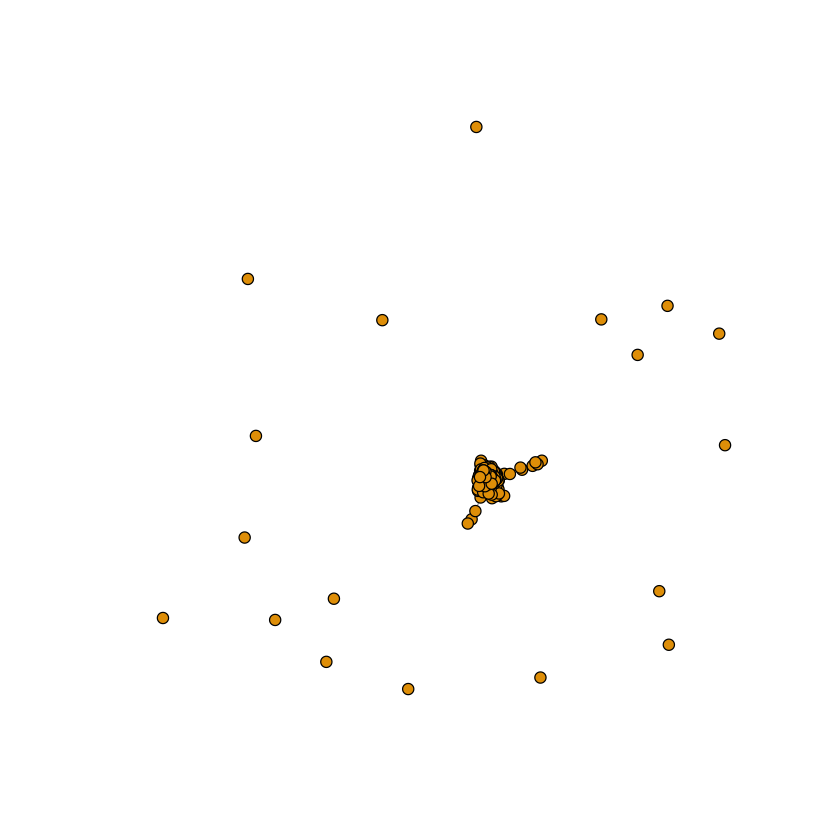

[1] "Mean:  4.034"
[1] "Variance:  3.91876276276276"
[1] "Problem 1.1b"
[1] "All connected:  FALSE"
[1] "Estimated probability that generated connected network: 0"


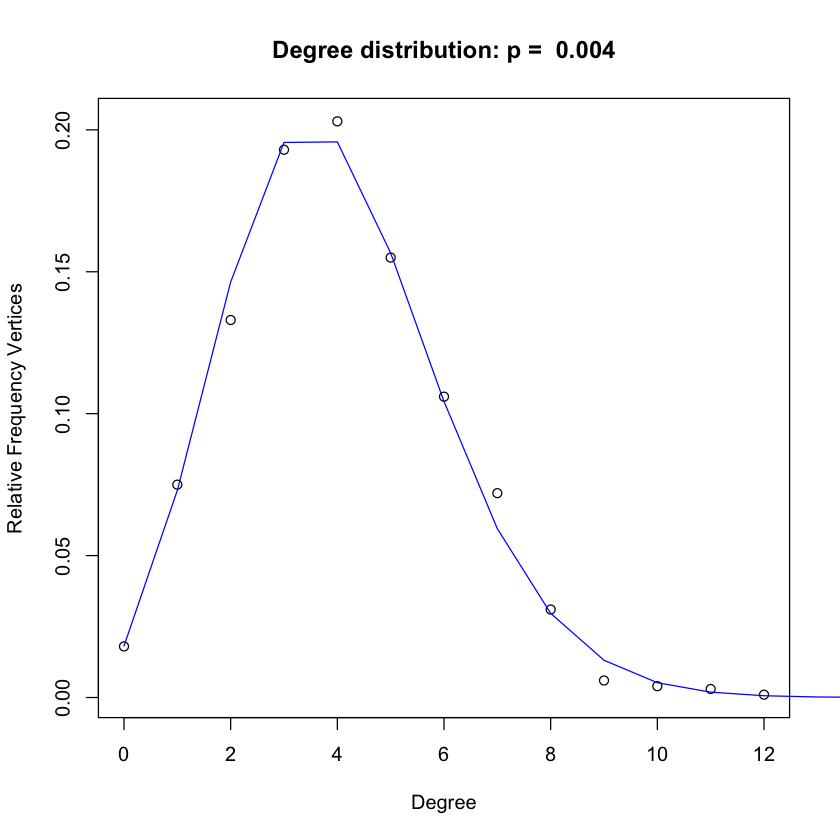

[1] "Diameter of GCC:  10"


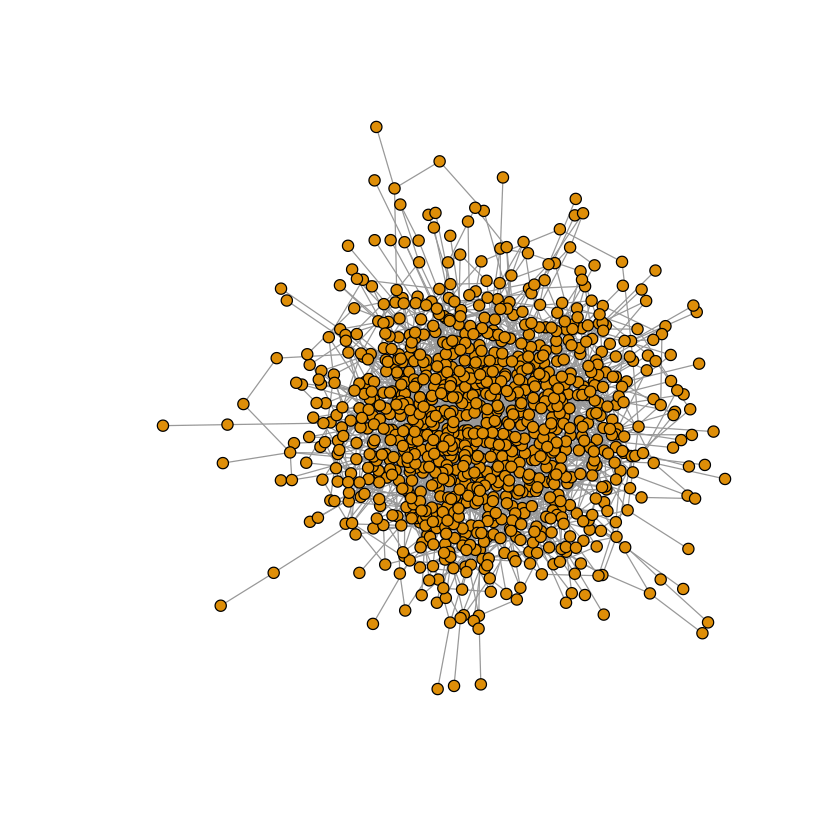

In [5]:
g1 = er_rand(p = 0.004)

[1] "Problem 1.1a"


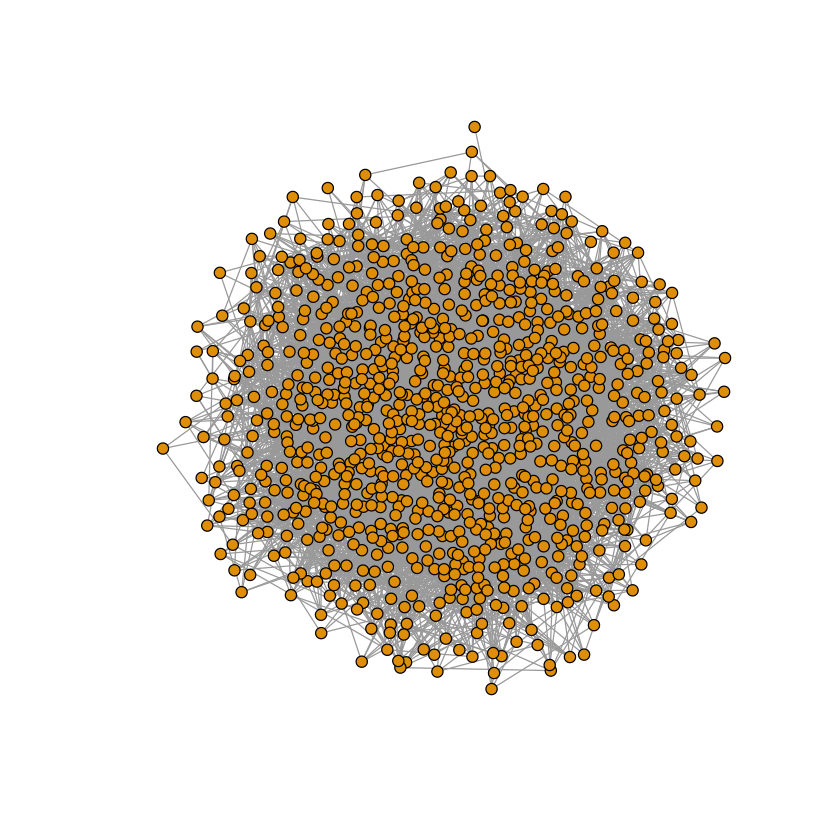

[1] "Mean:  10.03"
[1] "Variance:  9.80890890890891"
[1] "Problem 1.1b"
[1] "All connected:  FALSE"
[1] "Estimated probability that generated connected network: 0.932"


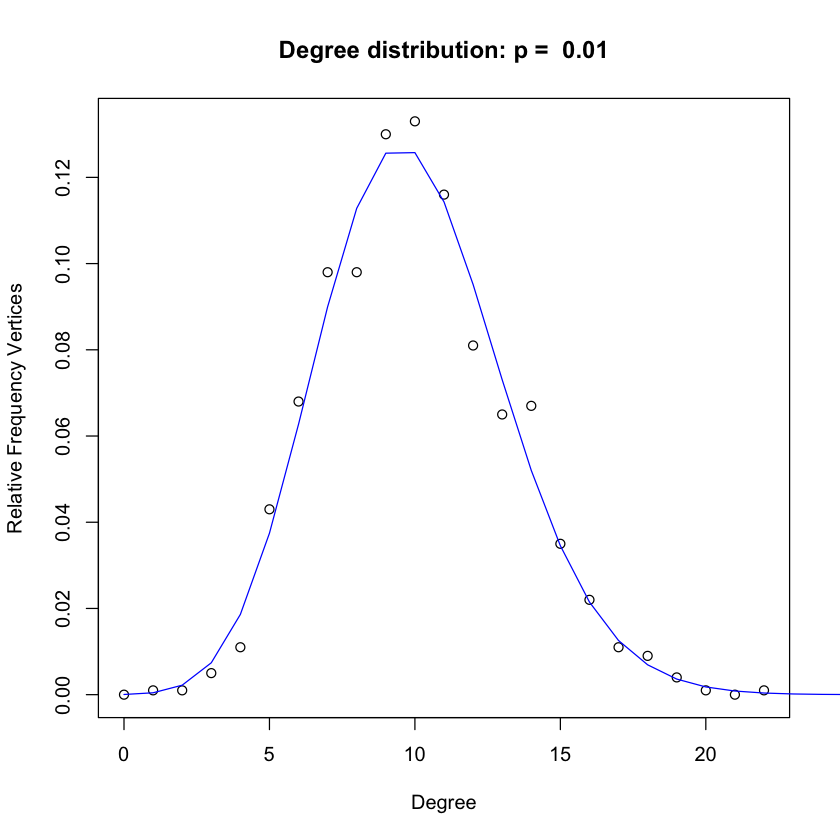

[1] "Diameter of GCC:  6"


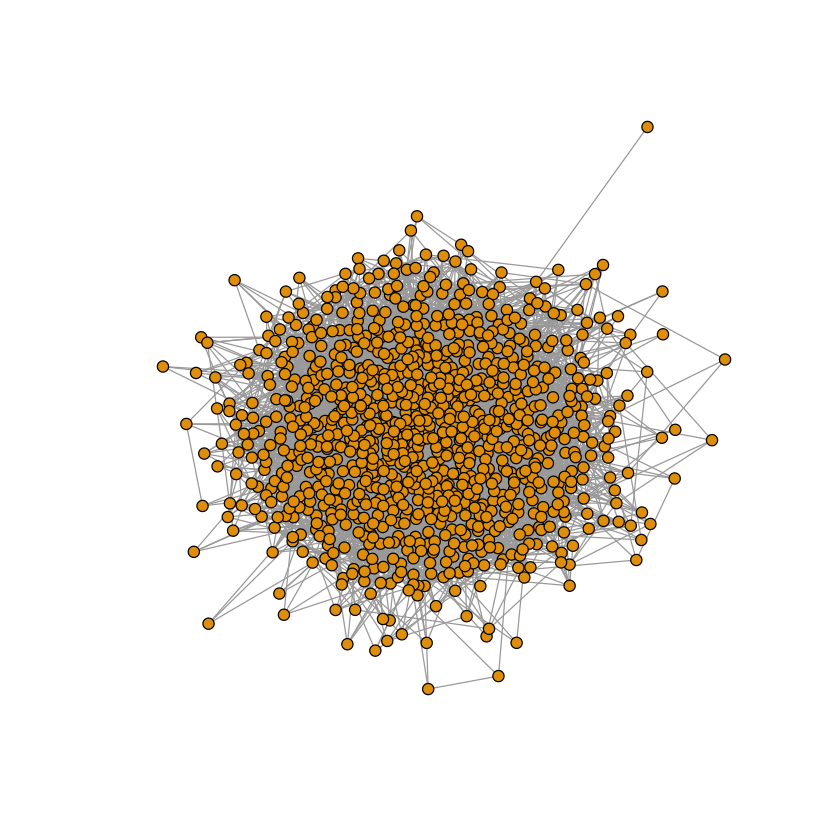

In [6]:
g1 = er_rand(p = 0.01)

[1] "Problem 1.a"
[1] "Problem 1.1a"


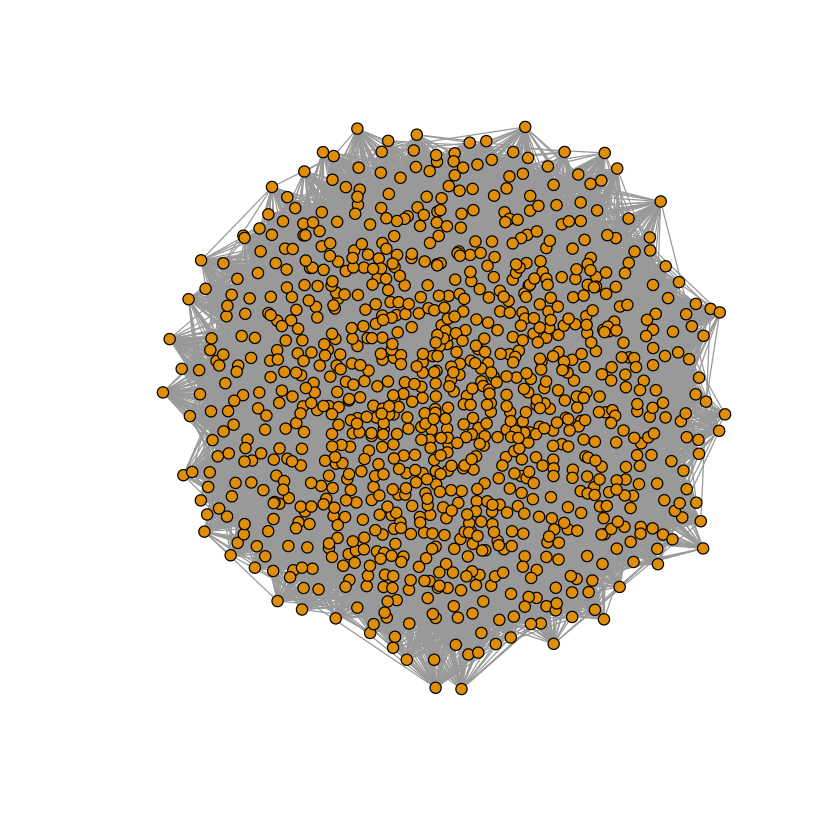

[1] "Mean:  50.012"
[1] "Variance:  48.4182742742743"
[1] "Problem 1.1b"
[1] "All connected:  TRUE"
[1] "Estimated probability that generated connected network: 1"


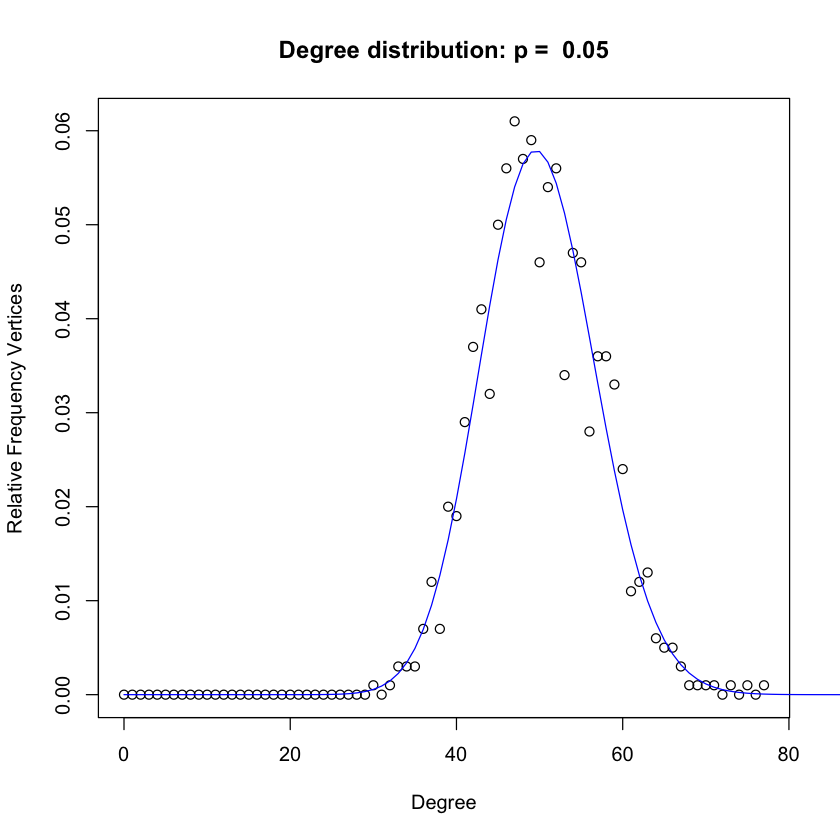

In [7]:
print('Problem 1.a')
g1 = er_rand(p = 0.05)

In [ ]:

g1 = er_rand(p = 0.1)

[1] "Problem 1.1c"


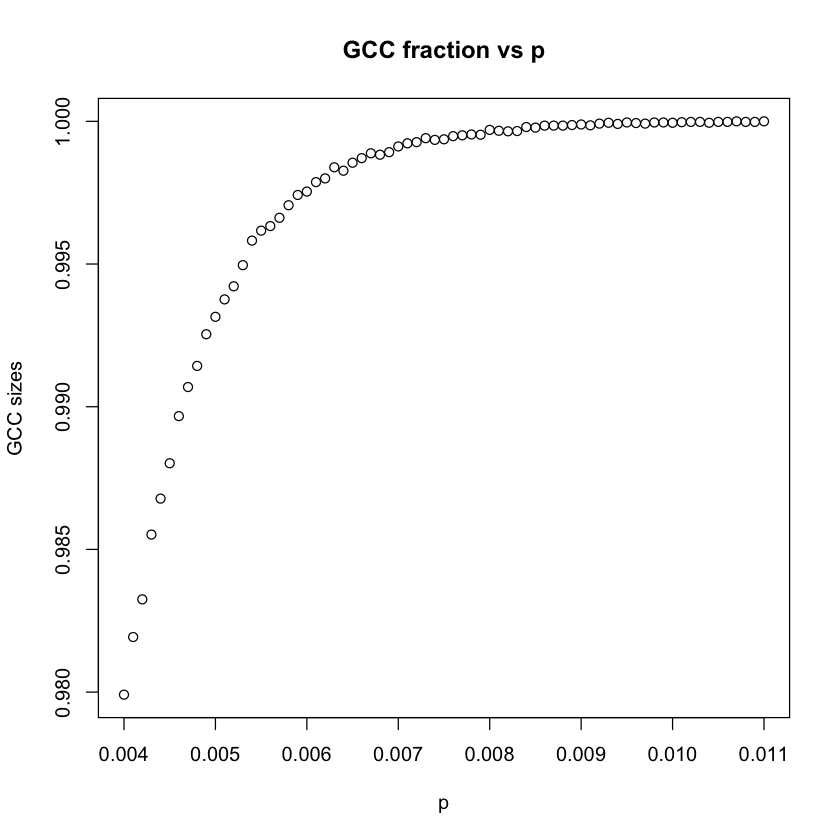

In [43]:
er_create_100_random_networks()
# gcc sizes seem to level off around 0.007.
#similar to our log value using n = 1000

[1] "Problem 1.1d(i)"
[1] "Problem 1.1d(ii)"


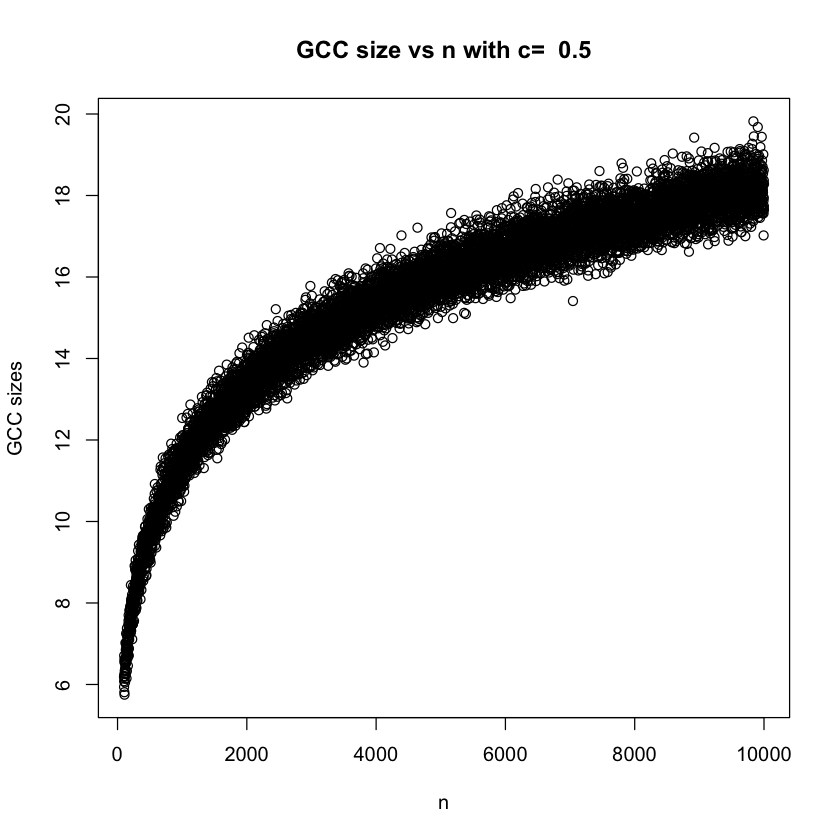

[1] "Problem 1.1d(iii)"


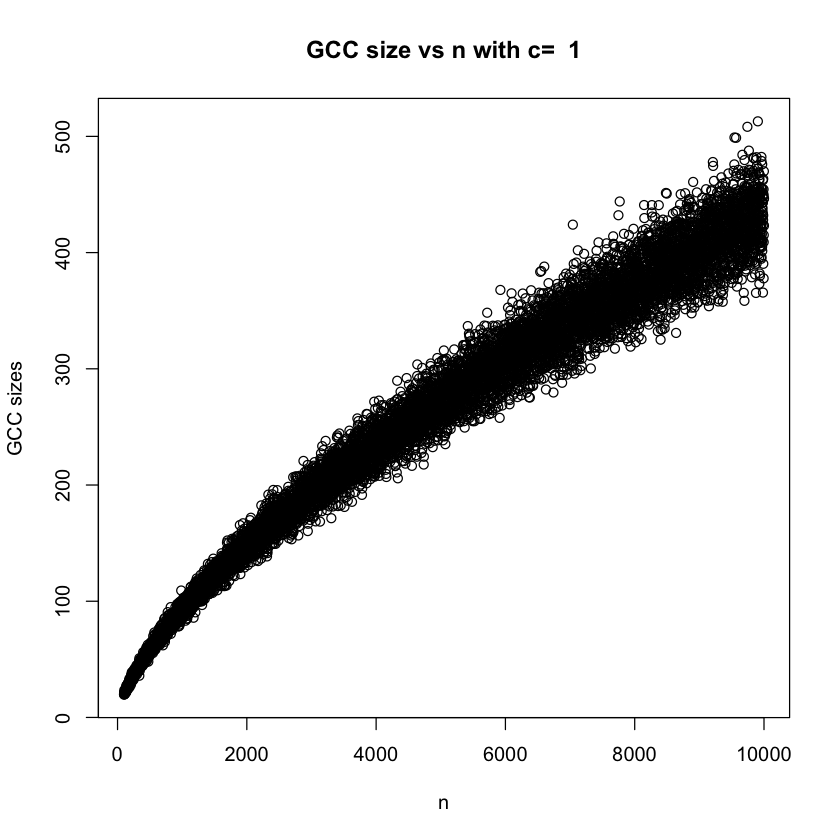

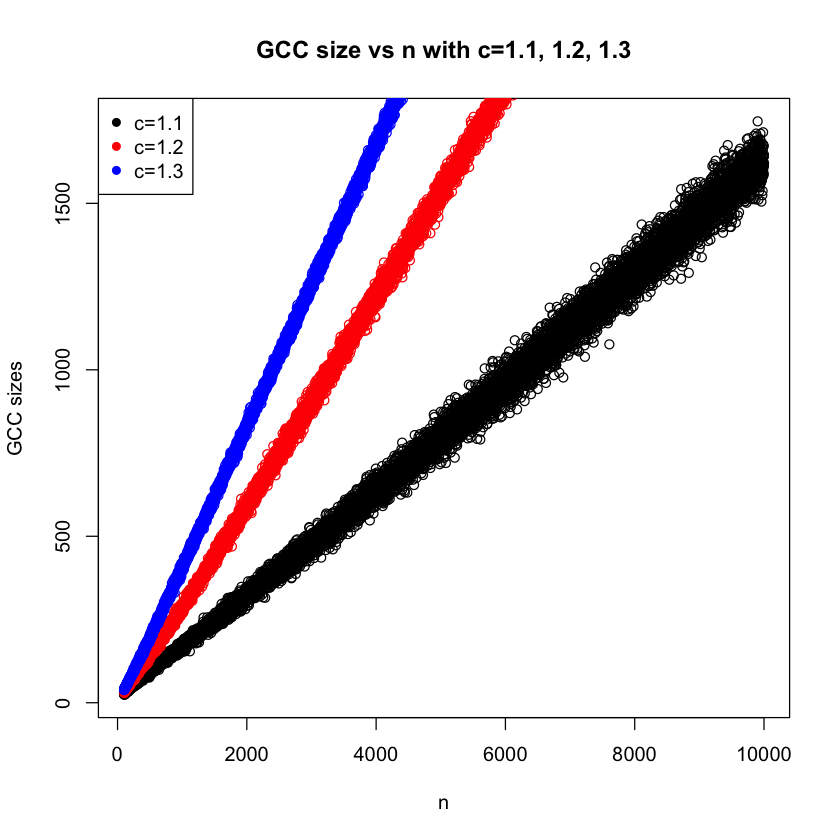

In [44]:
average_expected_gcc_size()

[1] "Problem 1.2a"
[1] 1


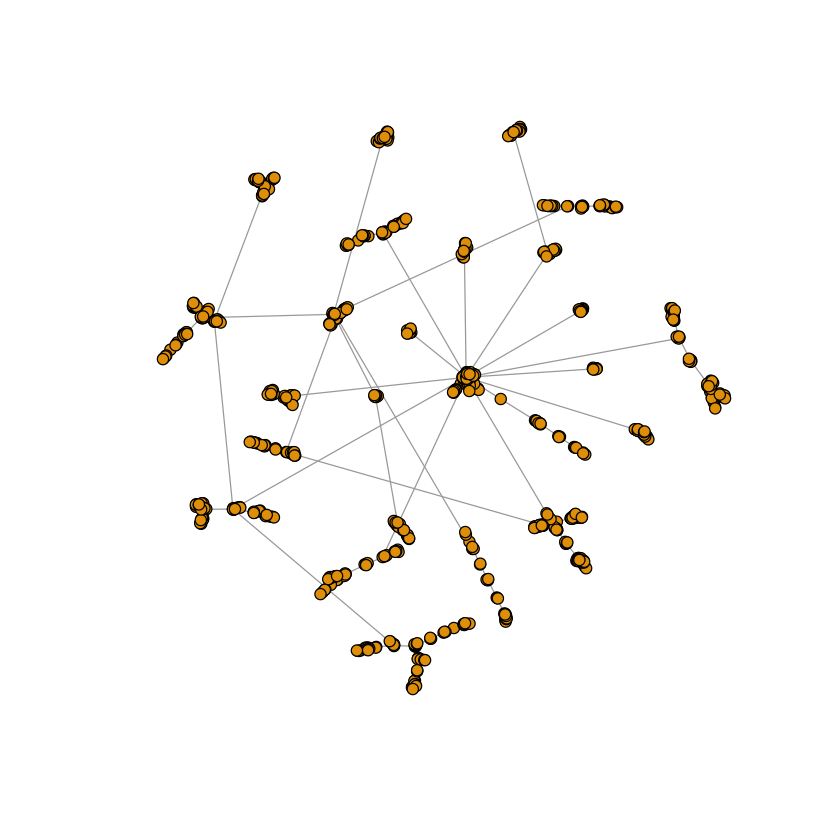

In [32]:
print('Problem 1.2a')

# we want to make sure that network is always connected.
# Therefore, we want to iterate through 1000 times which sould be sufficient

connected = 0
for (i in 1:1000){
    g1 = barabasi.game(1000, m=1, directed=F)
    if(is.connected(g1)){
        connected = connected + 1
    }
}

print(connected / 1000) # all connected so this graph seems to be always connected.

plot(g1, edge.arrow.size=.1, vertex.size=4, vertex.label=NA) 




[1] "Problem 1.2b"
[1] "Modularity:  0.929860290721152"
[1] "Connected:  TRUE"


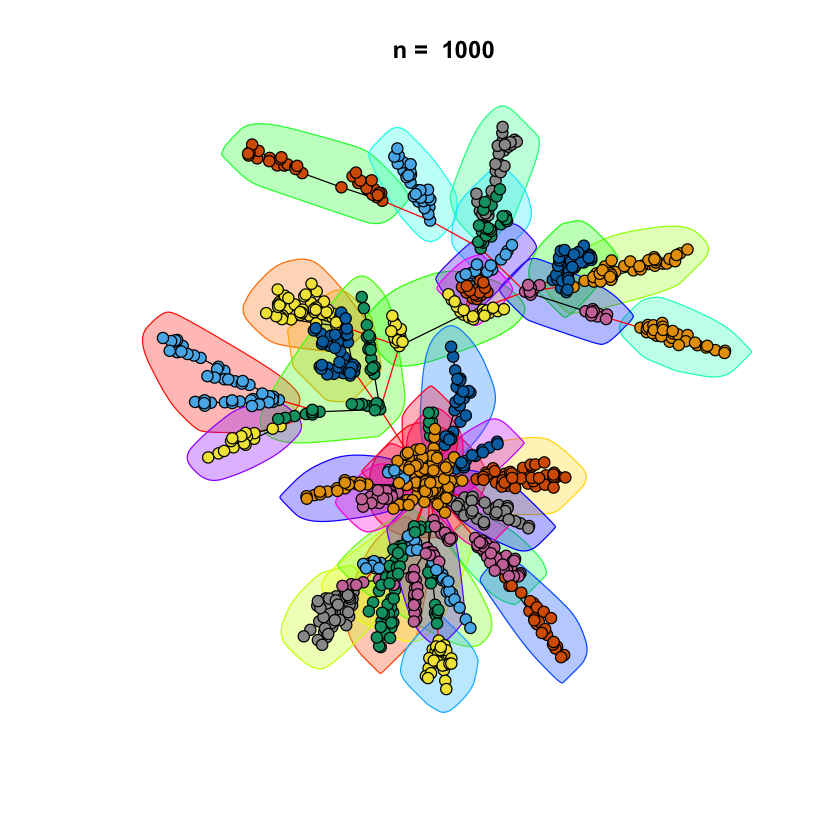

In [33]:
print('Problem 1.2b')
pa_fast_greedy(g1, 1000)

[1] "Problem 1.2c"
[1] "Modularity:  0.978620394292655"
[1] "Connected:  TRUE"


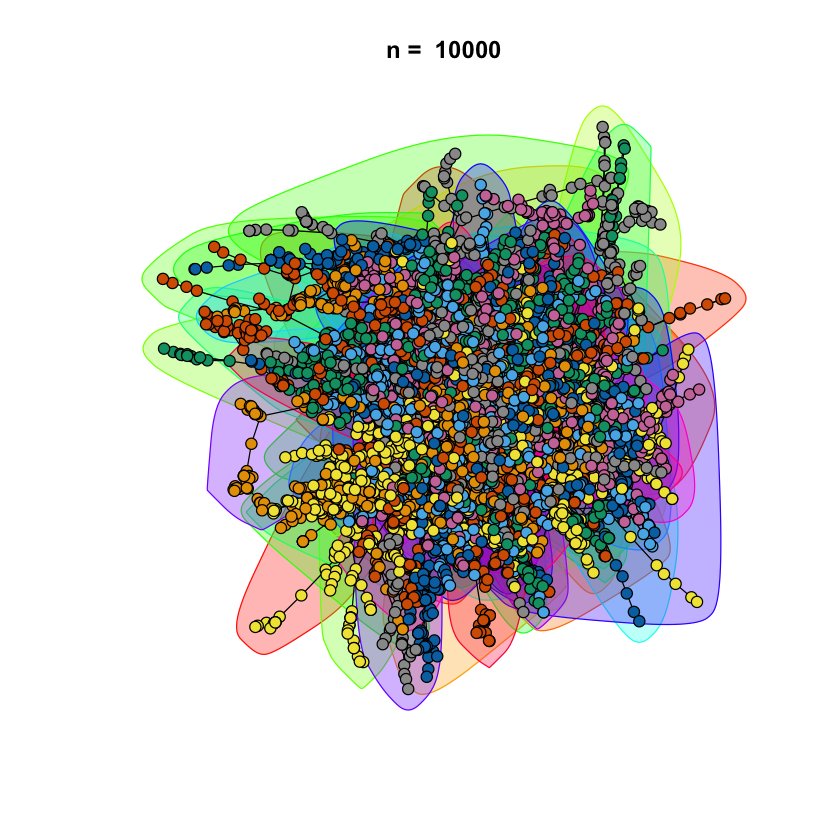

In [34]:
print('Problem 1.2c')
g2 = barabasi.game(10000, m=1, directed=F)

pa_fast_greedy(g2, 10000)
# QUESTION: How is it compared to the smaller network modularity? It looks like its slightly higher

[1] "Problem 1.2d"


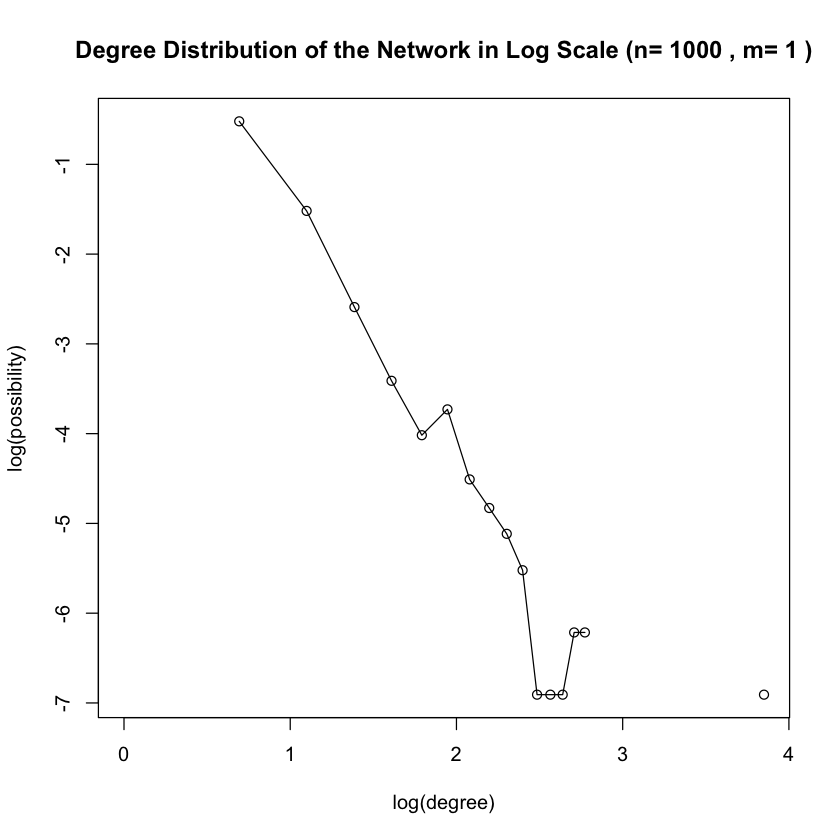

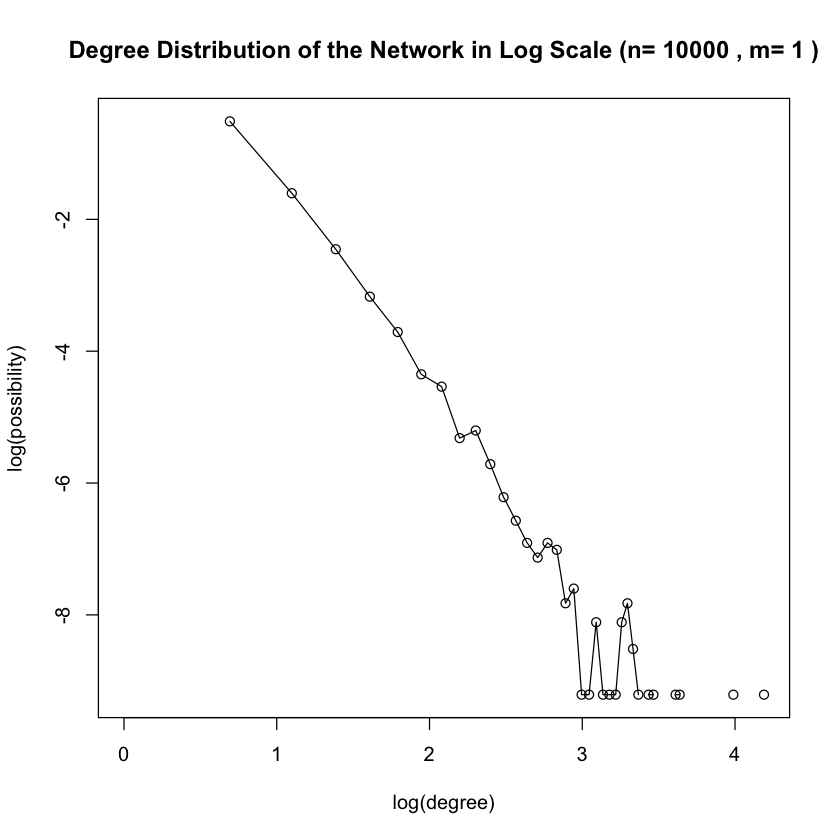

In [35]:
print('Problem 1.2d')
log_distribution_graph(g1, 1000)
log_distribution_graph(g2, 10000)

[1] "2.1e"


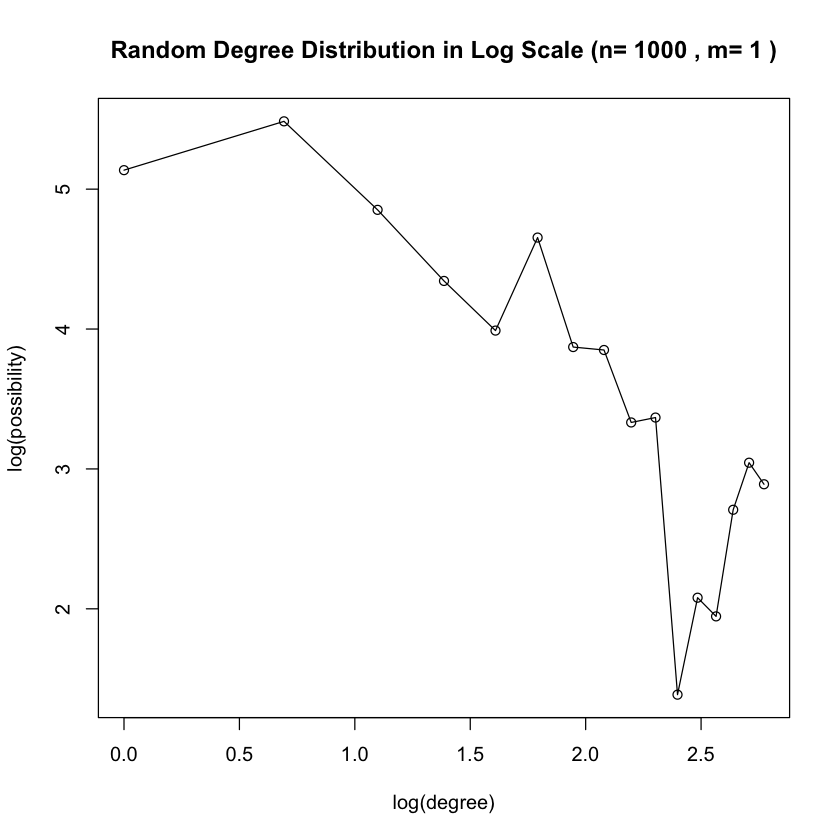

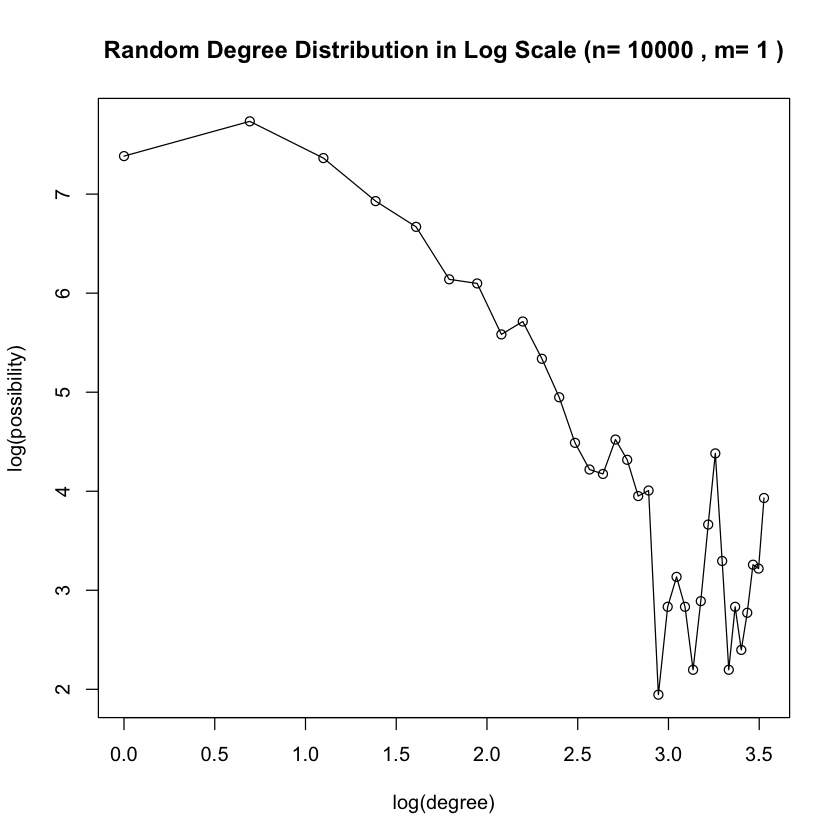

In [37]:
print('2.1e')
pa_rand_node_dd(g1, 1000)
pa_rand_node_dd(g2, 10000)

[1] "Problem 1.2f"
[1] "the older the node, the higher degree expected. Also, as number of nodes increases, degree increases as well."


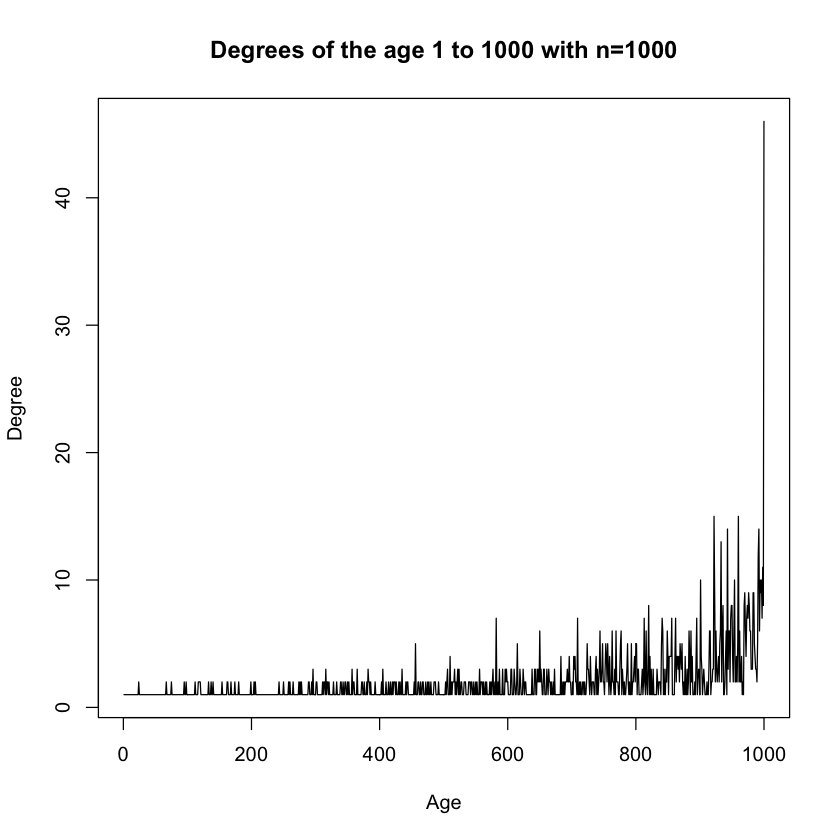

In [38]:
  #1-2f
print('Problem 1.2f')
print('the older the node, the higher degree expected. Also, as number of nodes increases, degree increases as well.')
deg_age <-rev(degree(g1)[1:1000])
plot(deg_age,type='l',main="Degrees of the age 1 to 1000 with n=1000",xlab="Age",ylab="Degree")

[1] "Problem 1.2f"


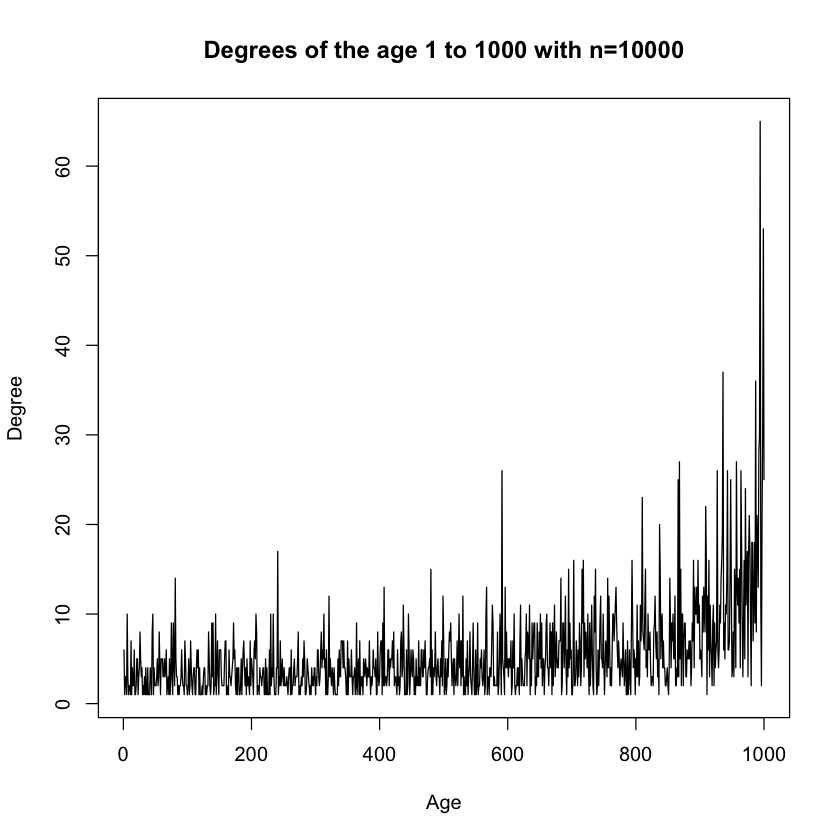

In [39]:
  #1-2f
print('Problem 1.2f')
deg_age <-rev(degree(g2)[1:1000])
plot(deg_age,type='l',main="Degrees of the age 1 to 1000 with n=10000",xlab="Age",ylab="Degree")

[1] "Problem 1.2g"
[1] 1


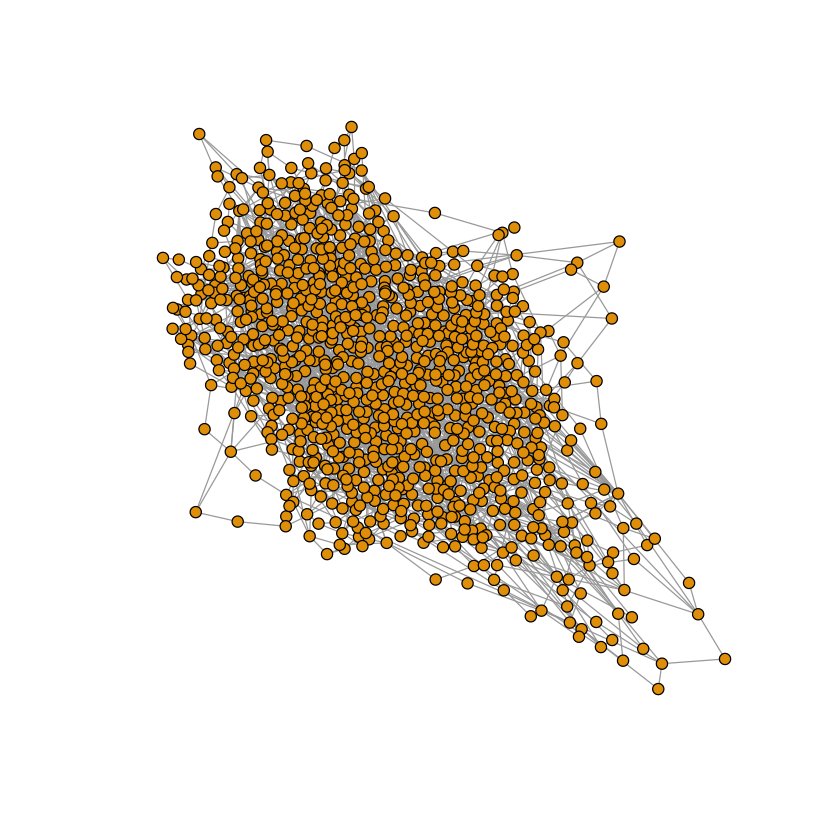

In [40]:
print('Problem 1.2g')

# (a), m = 2
g3 = barabasi.game(1000, m=2, directed=F)
plot(g3, edge.arrow.size=.1, vertex.size=4, vertex.label=NA)

connected = 0
for (i in 1:1000){
    g3_connect = barabasi.game(1000, m=2, directed=F)
    if(is.connected(g3_connect)){
        connected = connected + 1
    }
}

print(connected / 1000) # all connected so this graph seems to be always connected.

[1] "Modularity:  0.530609008154194"
[1] "Connected:  TRUE"


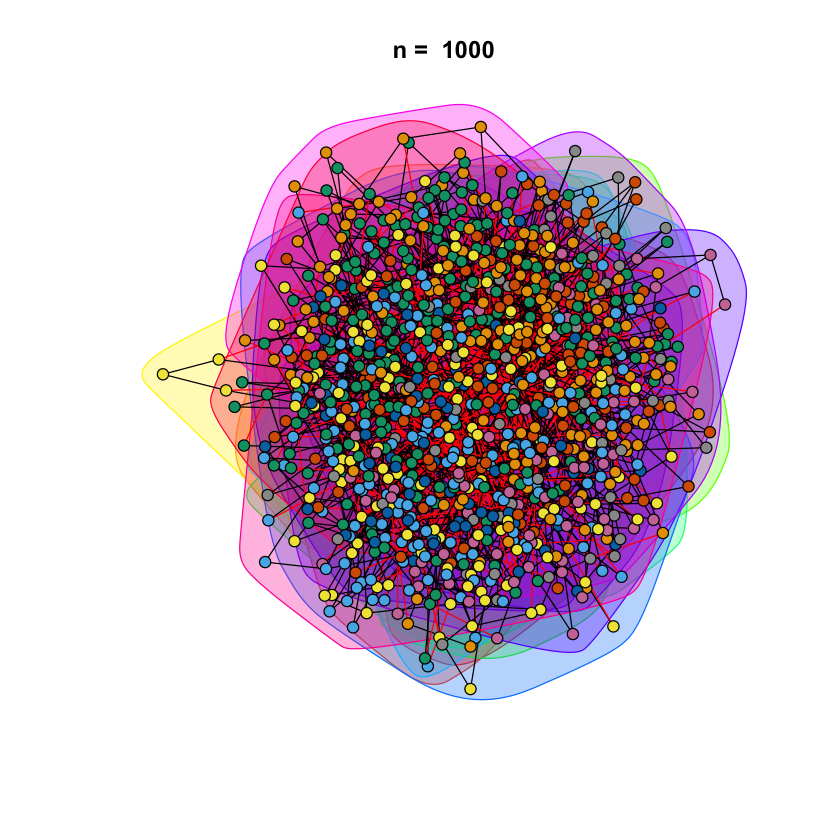

In [41]:
pa_fast_greedy(g3, 1000)

[1] "Modularity:  0.52993810825887"
[1] "Connected:  TRUE"


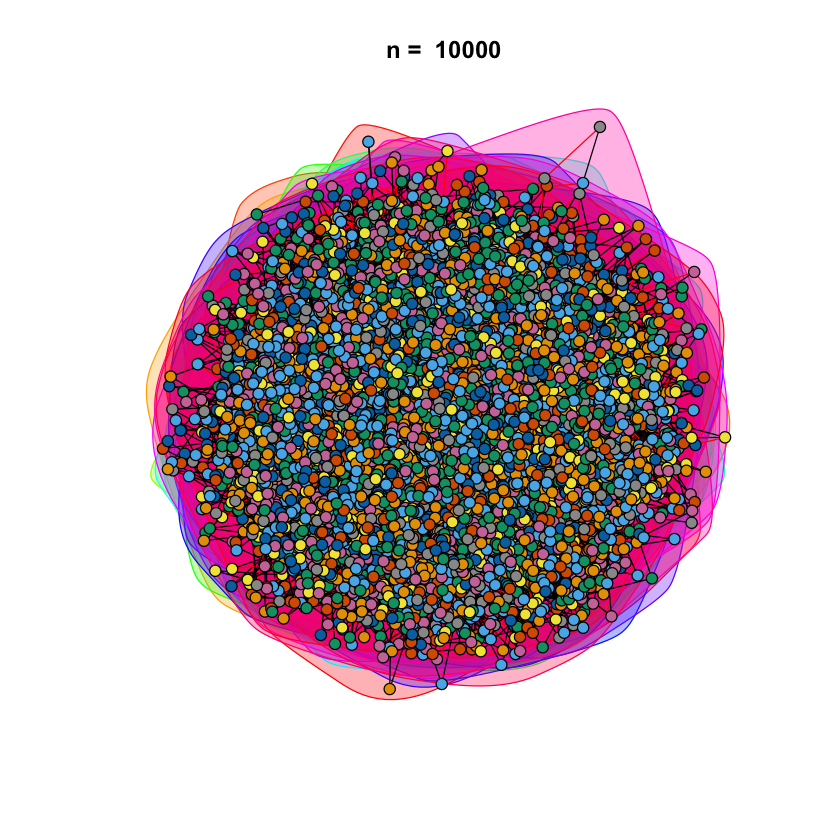

In [42]:
# (c), m = 2
g4 = barabasi.game(10000, m=2, directed=F)

pa_fast_greedy(g4, 10000)
# QUESTION: How is it compared to the smaller network modularity? It looks like its slightly higher

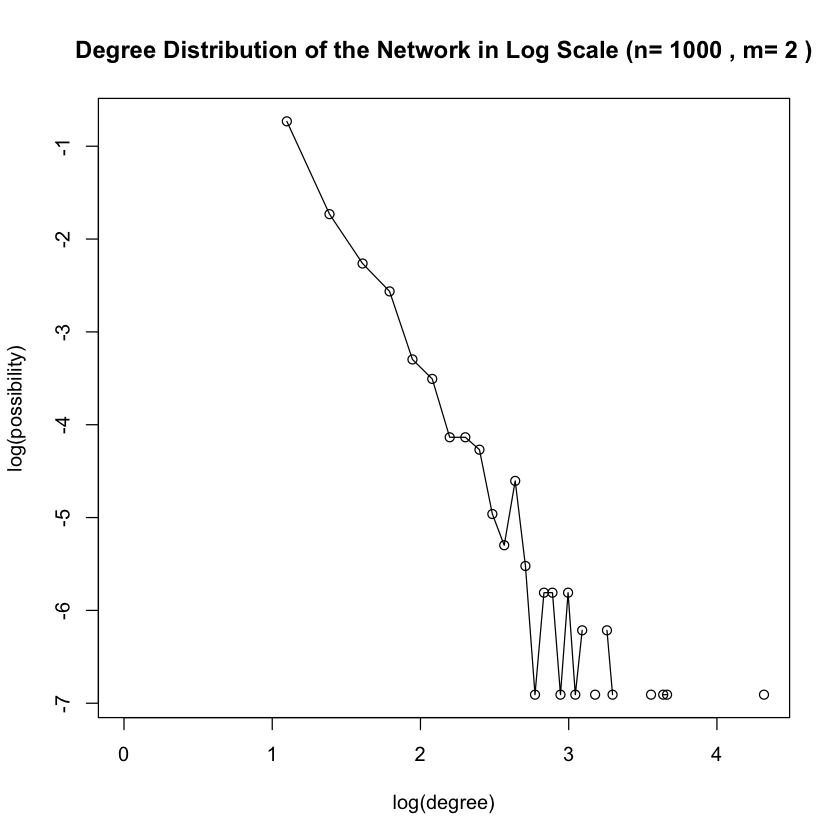

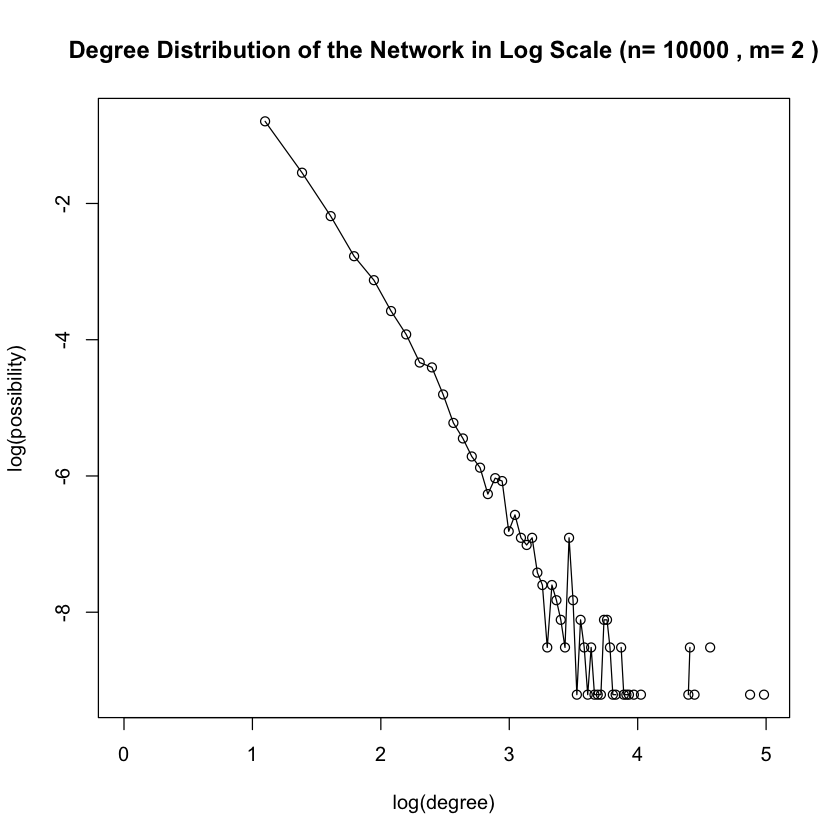

In [46]:
# (d), m = 2
log_distribution_graph(g3, 1000, 2)
log_distribution_graph(g4, 10000, 2)

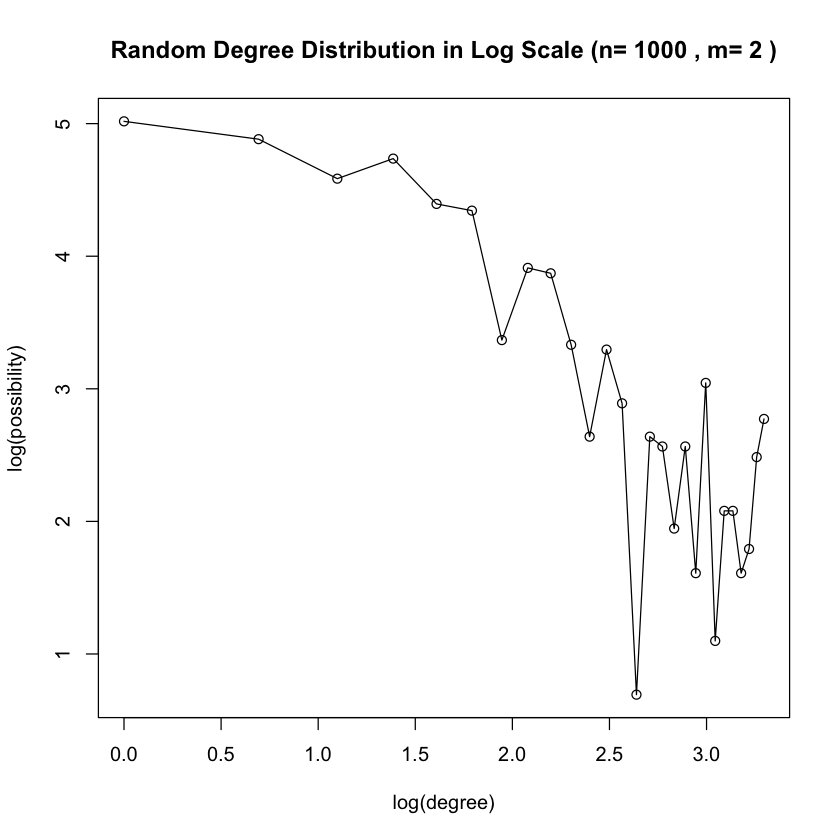

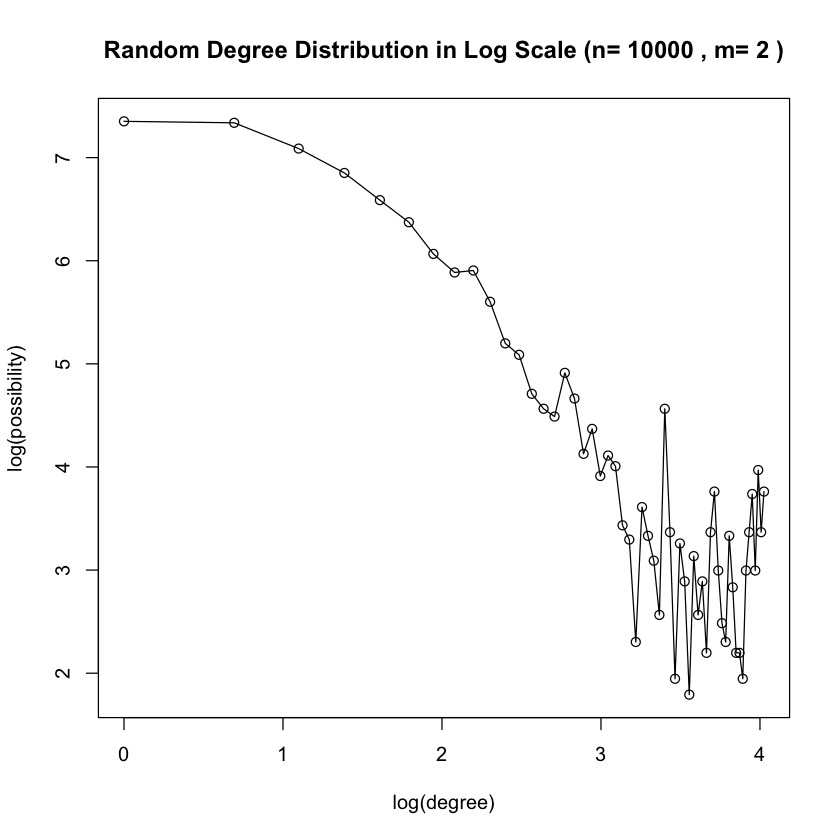

In [47]:
# (e), m = 2
pa_rand_node_dd(g3, 1000,2)
pa_rand_node_dd(g4, 10000,2)

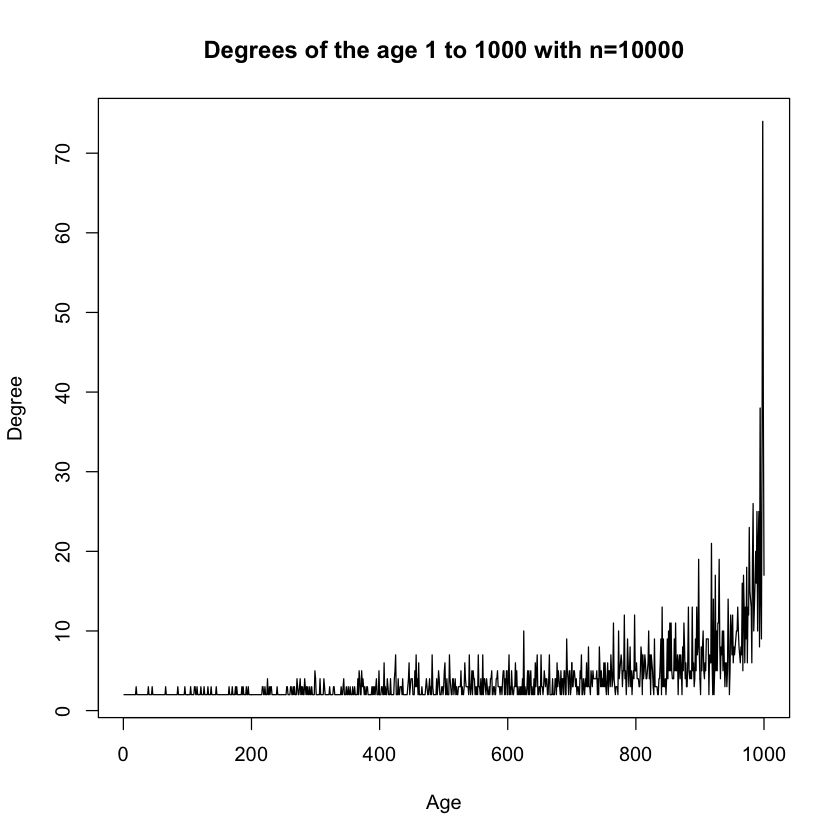

In [48]:
# (f), m = 2
deg_age <-rev(degree(g3)[1:1000])
plot(deg_age,type='l',main="Degrees of the age 1 to 1000 with n=10000",xlab="Age",ylab="Degree")

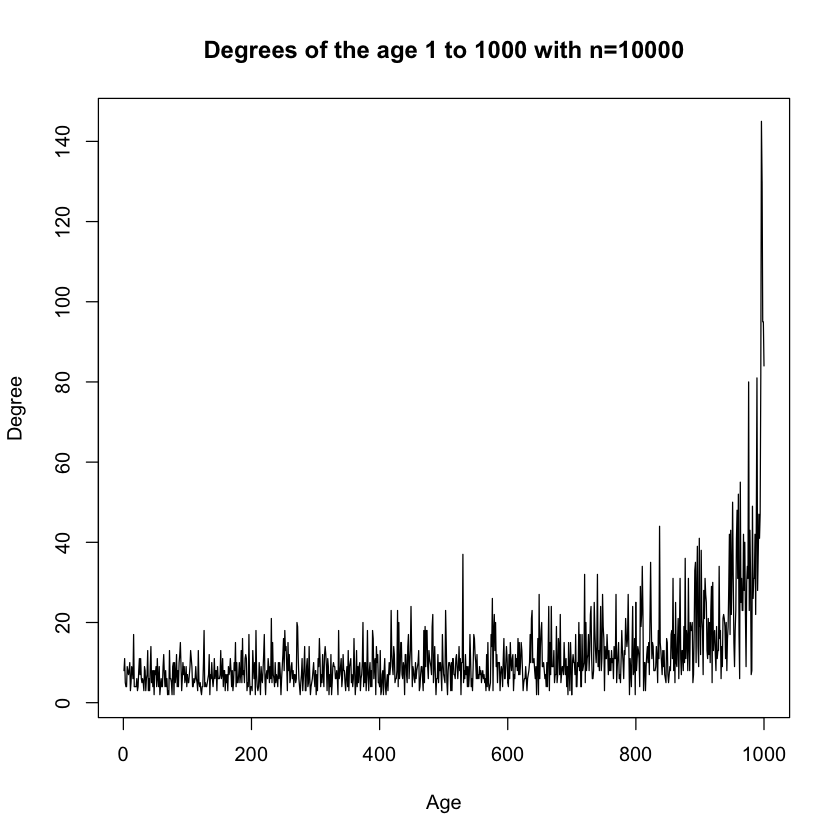

In [49]:
# (f), m = 2
deg_age <-rev(degree(g4)[1:1000])
plot(deg_age,type='l',main="Degrees of the age 1 to 1000 with n=10000",xlab="Age",ylab="Degree")

[1] "Problem 1.2g"
[1] 1


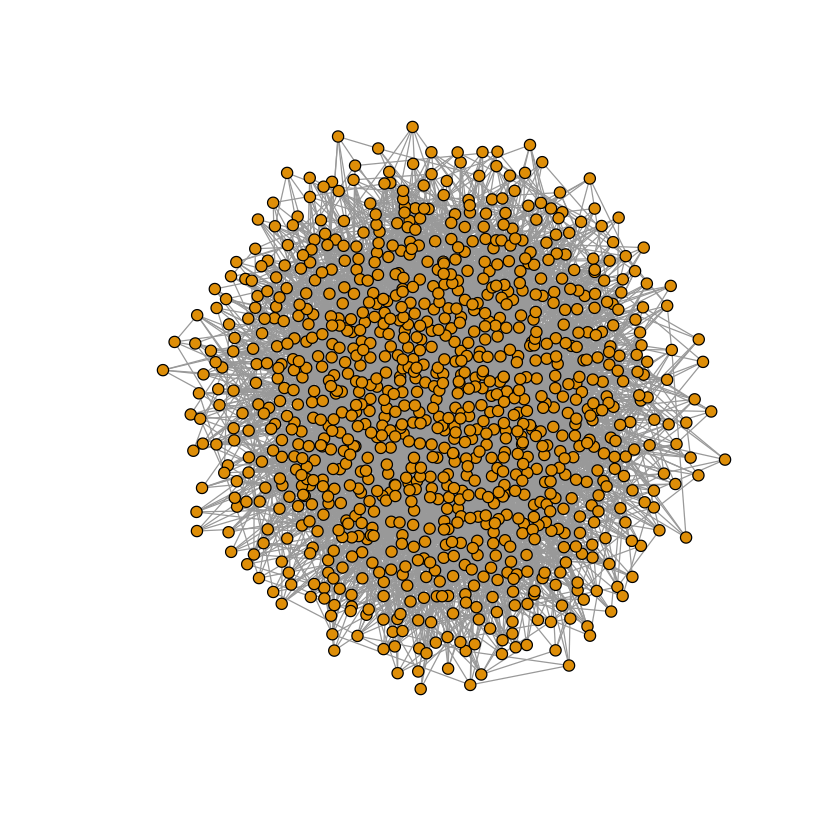

In [50]:
print('Problem 1.2g')

# (a), m = 5
g3 = barabasi.game(1000, m=5, directed=F)
plot(g3, edge.arrow.size=.1, vertex.size=4, vertex.label=NA)

connected = 0
for (i in 1:1000){
    g3_connect = barabasi.game(1000, m=2, directed=F)
    if(is.connected(g3_connect)){
        connected = connected + 1
    }
}

print(connected / 1000) # all connected so this graph seems to be always connected.

[1] "Modularity:  0.279585758277843"
[1] "Connected:  TRUE"


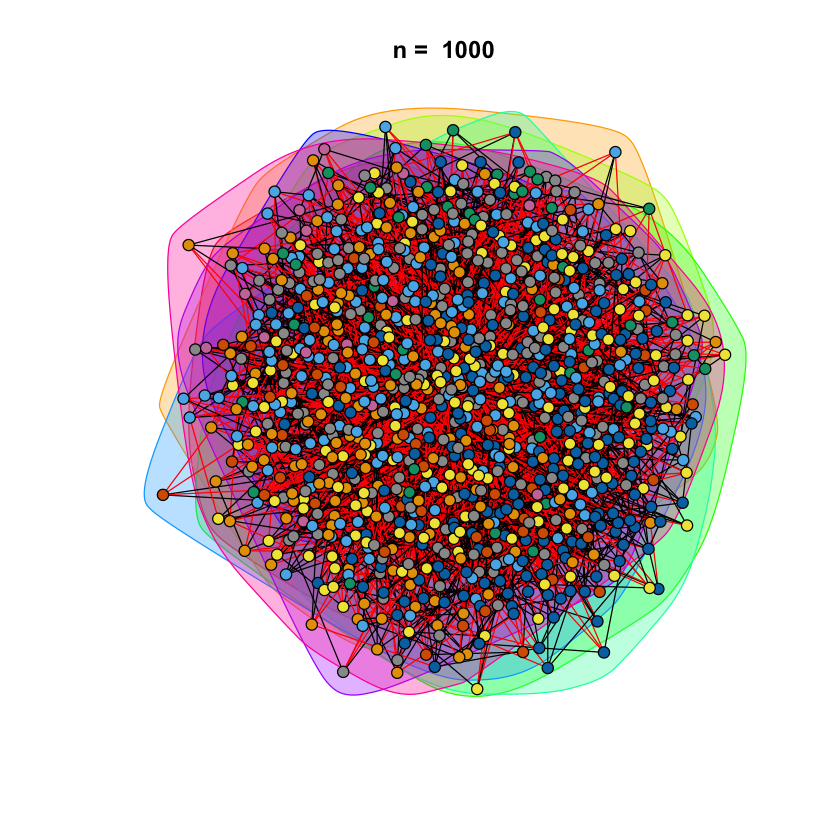

In [51]:
# (b), m = 5
pa_fast_greedy(g3, 1000)

[1] "Modularity:  0.274474100157425"
[1] "Connected:  TRUE"


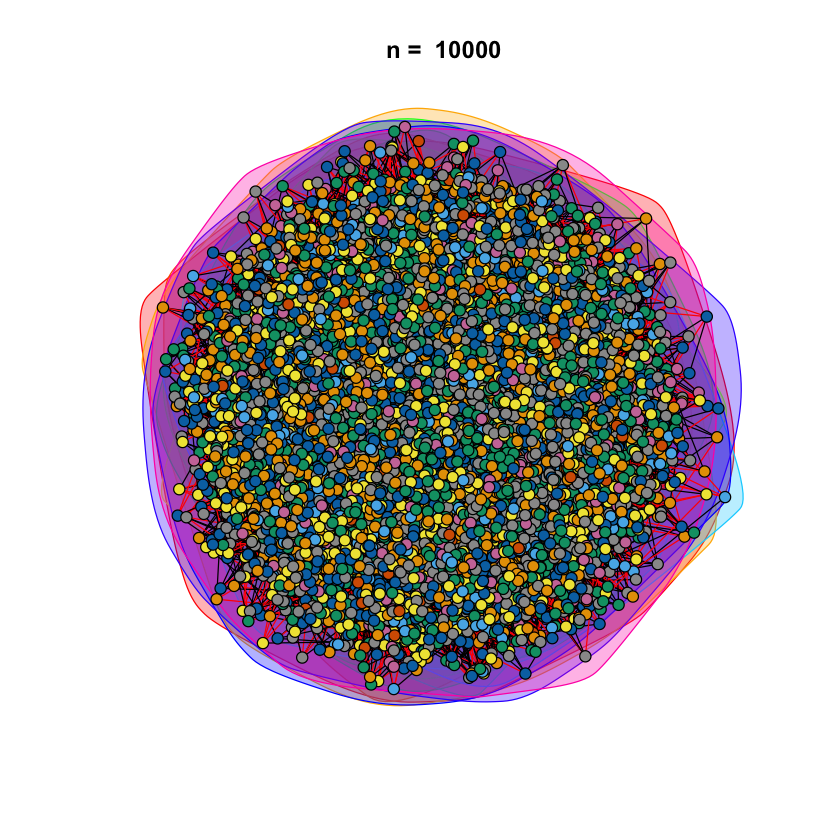

In [52]:
# (c), m = 5
g4 = barabasi.game(10000, m=5, directed=F)

pa_fast_greedy(g4, 10000)
# QUESTION: How is it compared to the smaller network modularity? It looks like its slightly higher

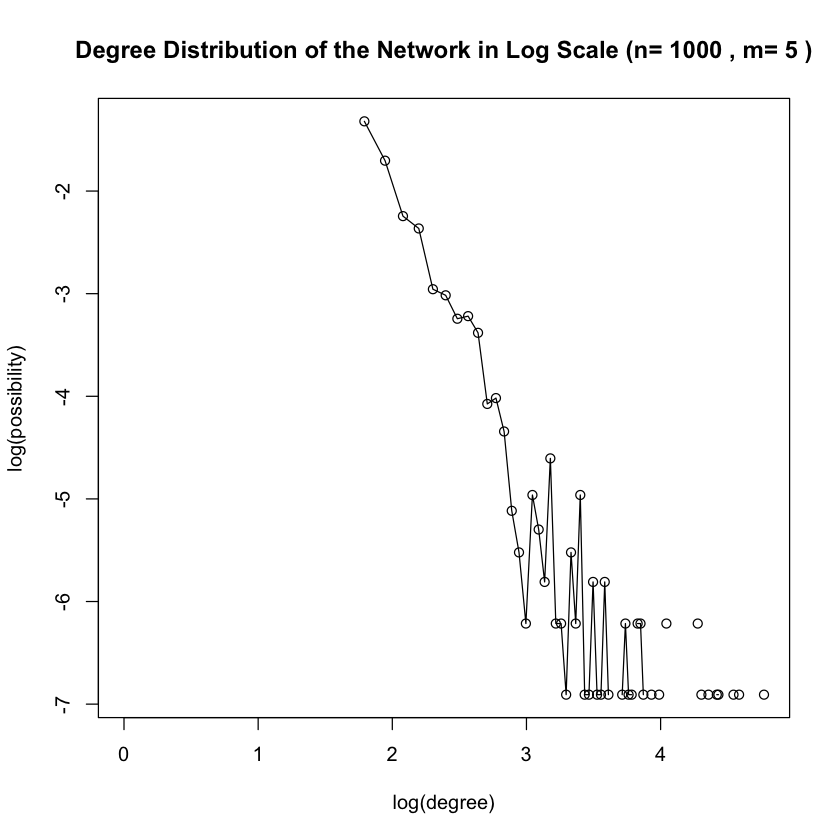

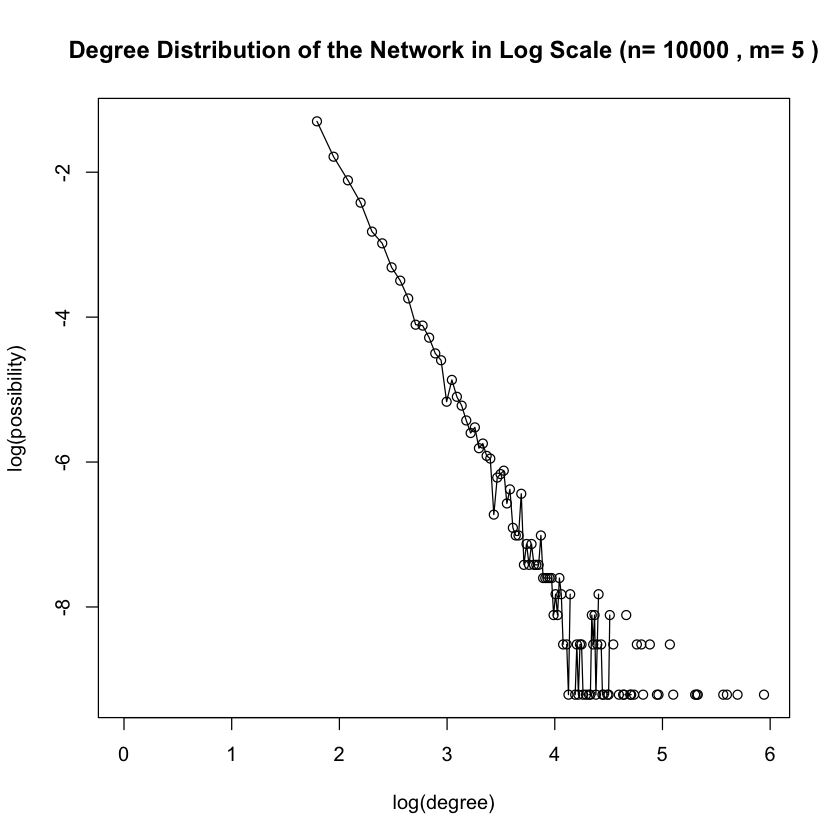

In [53]:
# (d), m = 5
log_distribution_graph(g3, 1000, 5)
log_distribution_graph(g4, 10000, 5)

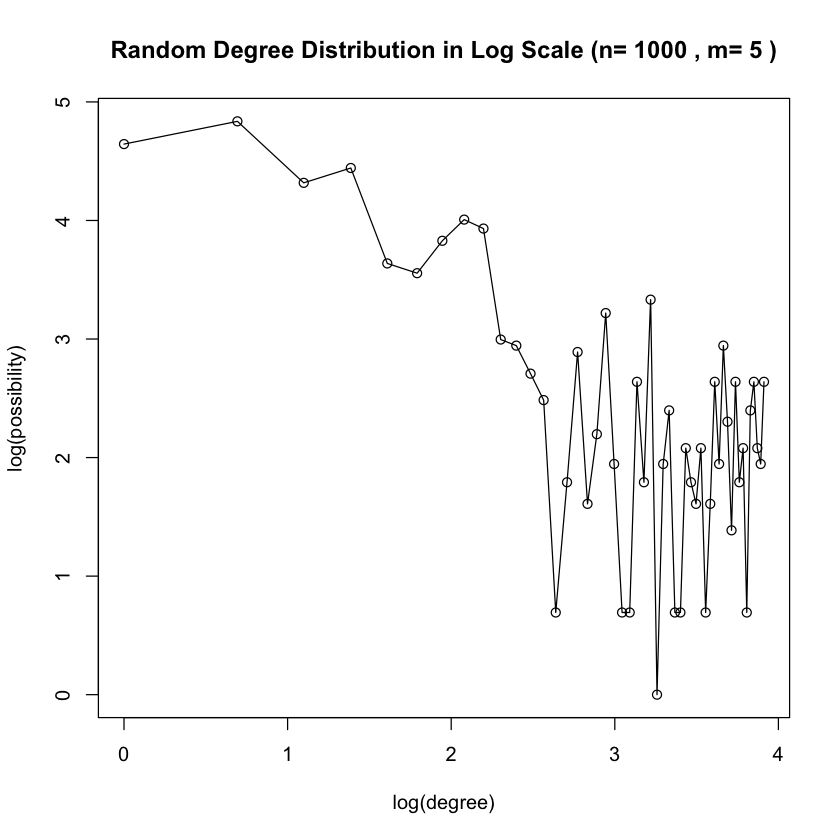

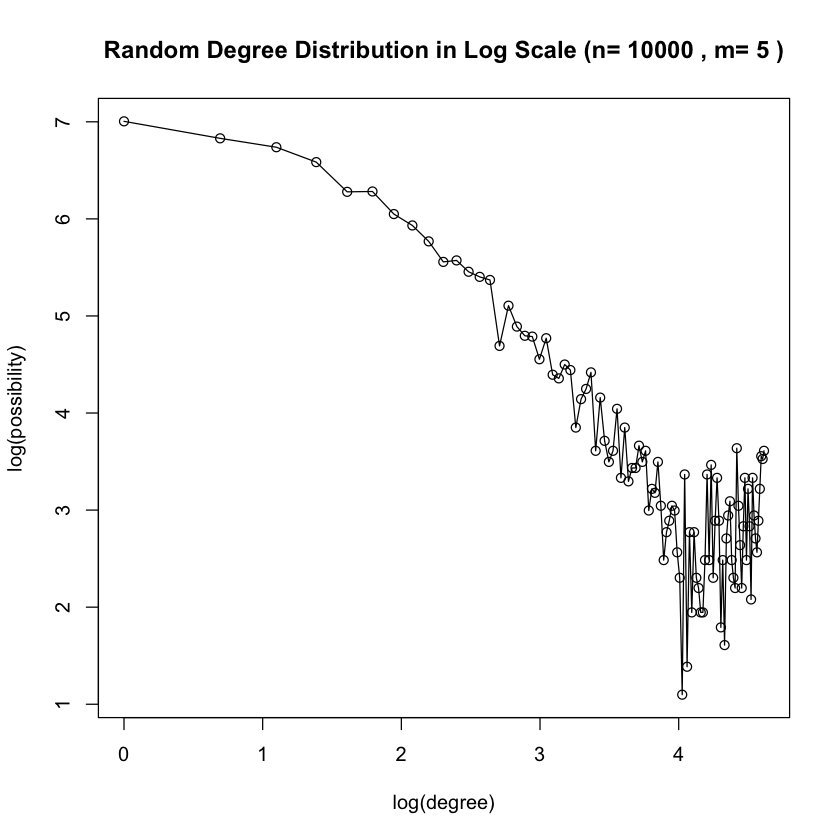

In [57]:
# (e), m = 5
pa_rand_node_dd(g3, 1000, 5)
pa_rand_node_dd(g4, 10000, 5)

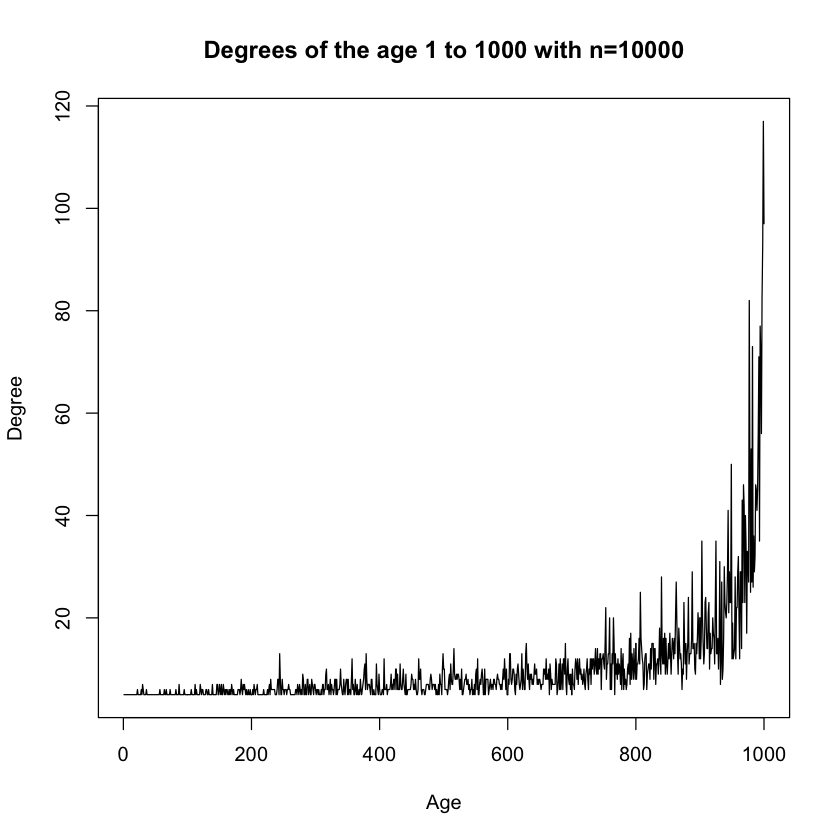

In [58]:
# (f), m = 5
deg_age <-rev(degree(g3)[1:1000])
plot(deg_age,type='l',main="Degrees of the age 1 to 1000 with n=10000",xlab="Age",ylab="Degree")

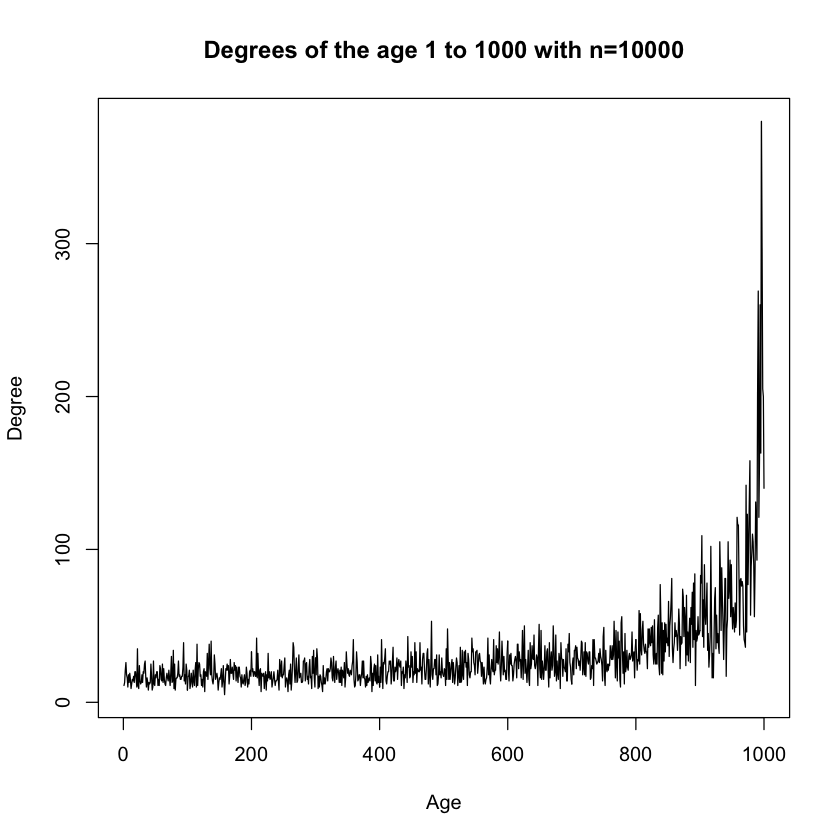

In [59]:
# (f), m = 5
deg_age <-rev(degree(g4)[1:1000])
plot(deg_age,type='l',main="Degrees of the age 1 to 1000 with n=10000",xlab="Age",ylab="Degree")

[1] "Problem 1.2h"
[1] "Modularity:  0.930433937440944"
[1] "Connected:  TRUE"


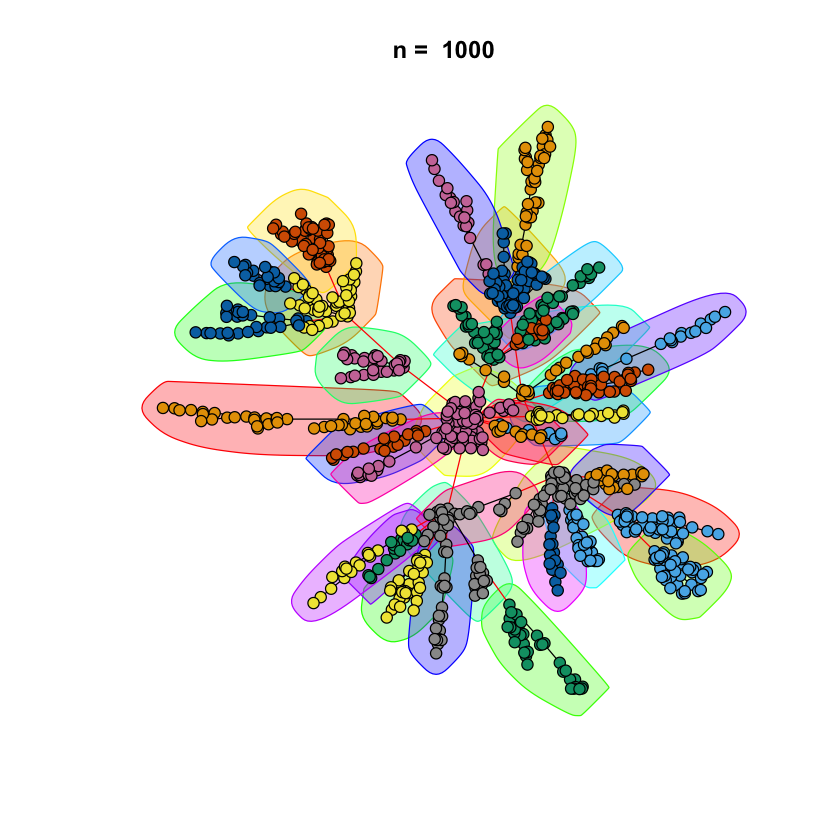

[1] "Modularity:  0.841096351606858"
[1] "Connected:  FALSE"


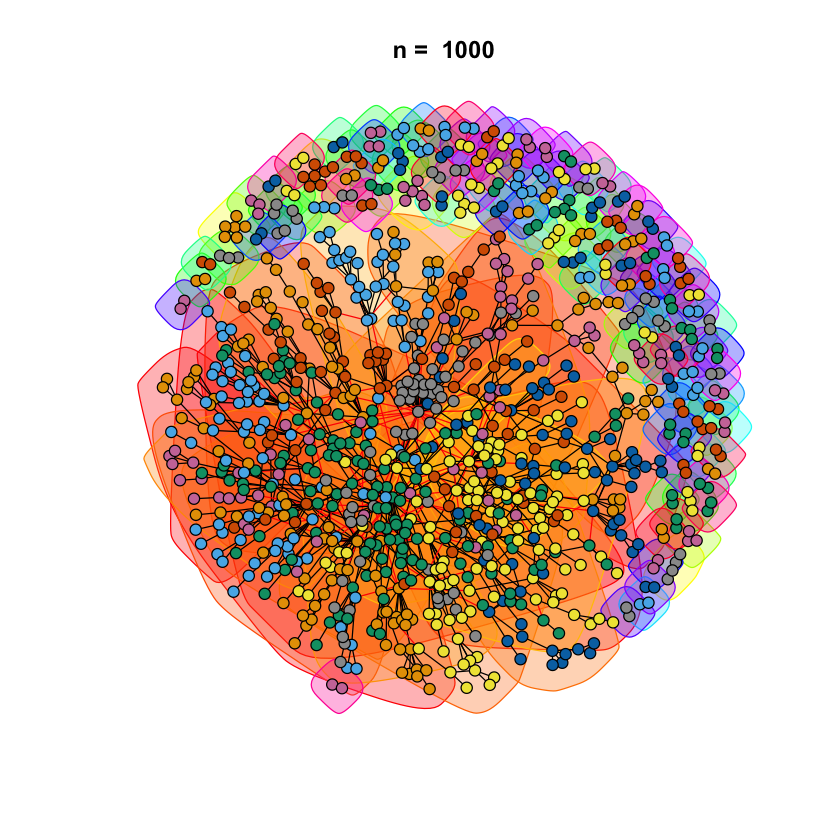

In [5]:
print('Problem 1.2h')

pa_g_for_matching = barabasi.game(1000, m = 1, directed=F)
# Get degree sequence for first network
pa_g_stub_matched = sample_degseq(degree(pa_g_for_matching), method="simple.no.multiple")

pa_fast_greedy(pa_g_for_matching, 1000)
pa_fast_greedy(pa_g_stub_matched, 1000)

[1] "Problem 1.3a"


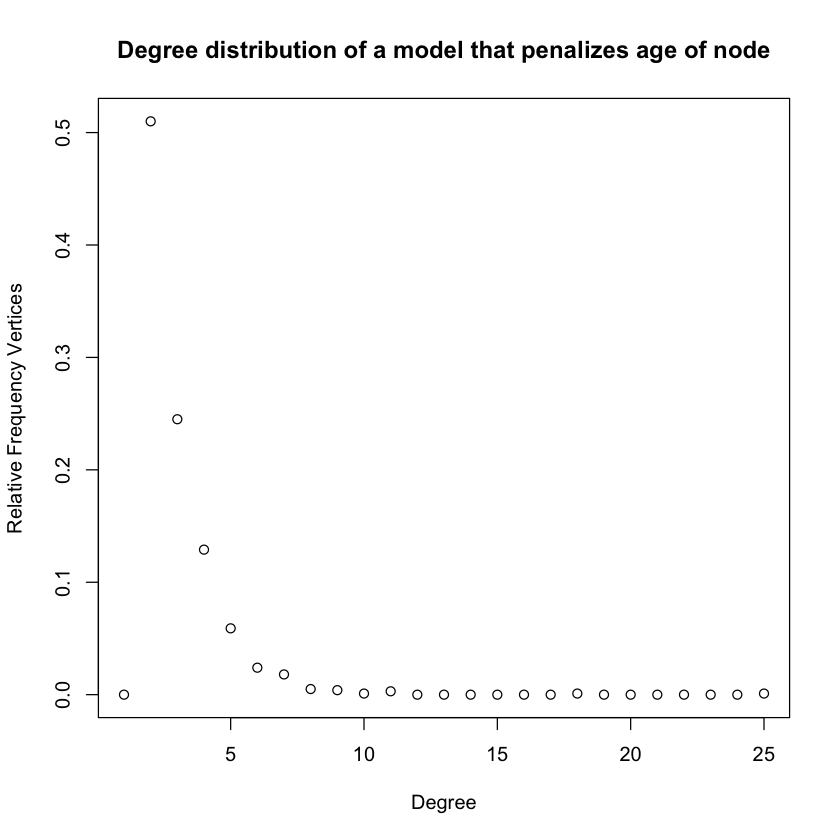

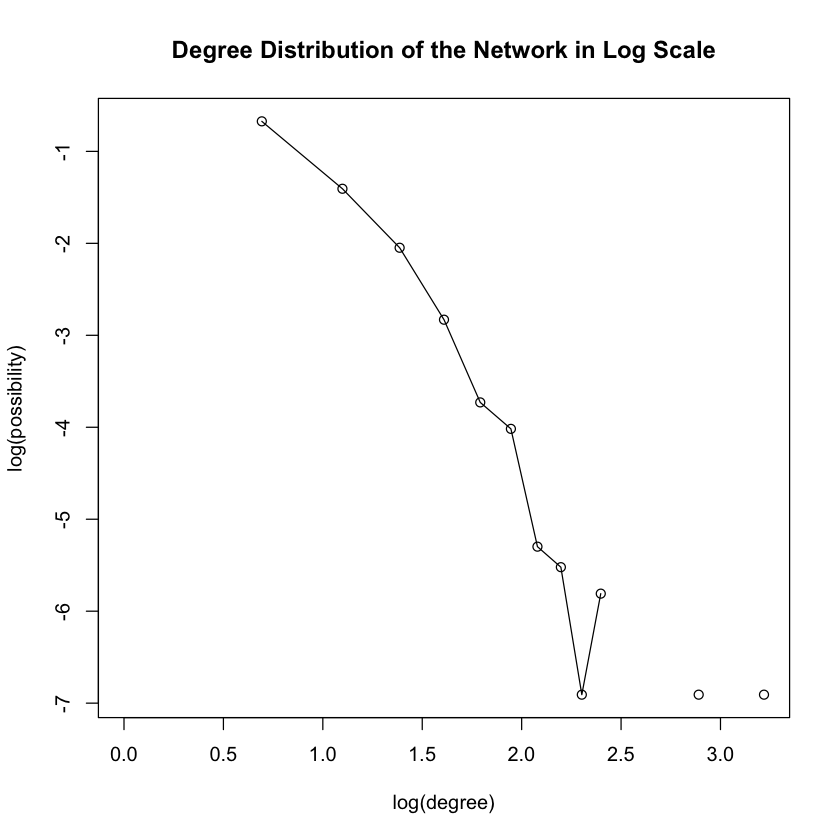

In [70]:
print('Problem 1.3a')
pa_g_age = sample_pa_age(1000, pa.exp=1, aging.exp=-1, aging.bin=1000, directed=F)

pa_dd_age = degree_distribution(pa_g_age)
# TODO: Check a = c = d = 1, b = 0

plot(pa_dd_age, main="Degree distribution of a model that penalizes age of node",xlab="Degree",ylab="Relative Frequency Vertices")

log_degree <- log(c(1:length(pa_dd_age)))
log_distr <- log(pa_dd_age)
df <- data.frame(log_degree, log_distr)
plot(log_degree, log_distr, type="o",main=paste("Degree Distribution of the Network in Log Scale"),xlab="log(degree)",ylab="log(possibility)")

[1] "Problem 1.3b"
[1] "Modularity:  0.935543651759868"
[1] "Connected:  TRUE"


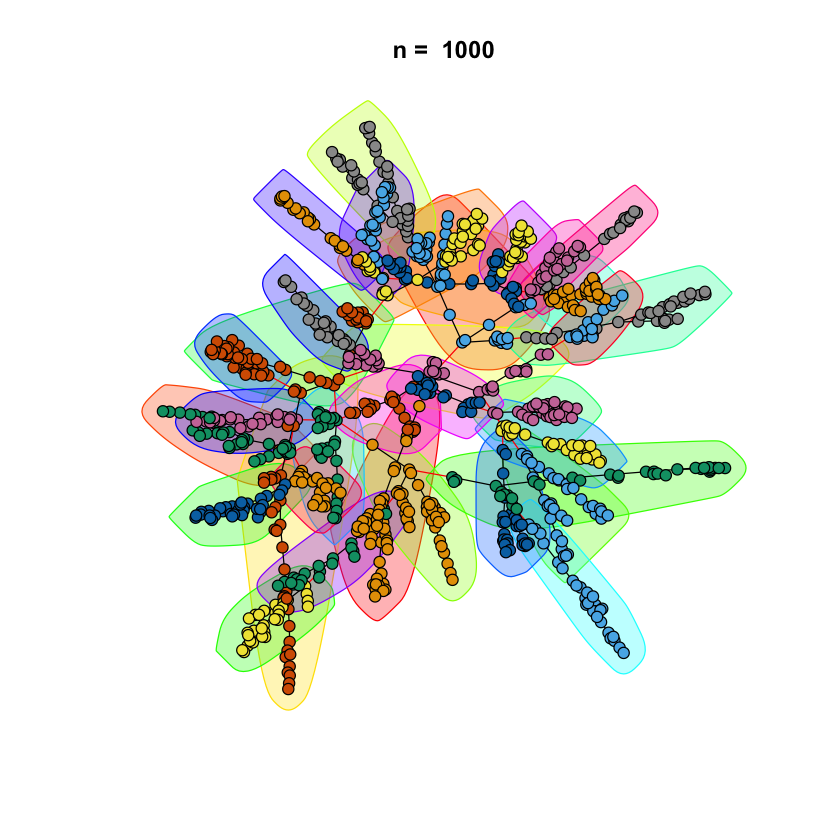

In [82]:
print('Problem 1.3b')
pa_fast_greedy(pa_g_age, 1000)

In [ ]:
# Problem 2

In [ ]:
# Random walk on Erdos-Renyi networks

In [7]:
# (a) Create an undirected random network with 1000 nodes, and the probability p for
# drawing an edge between any pair of nodes equal to 0.01.


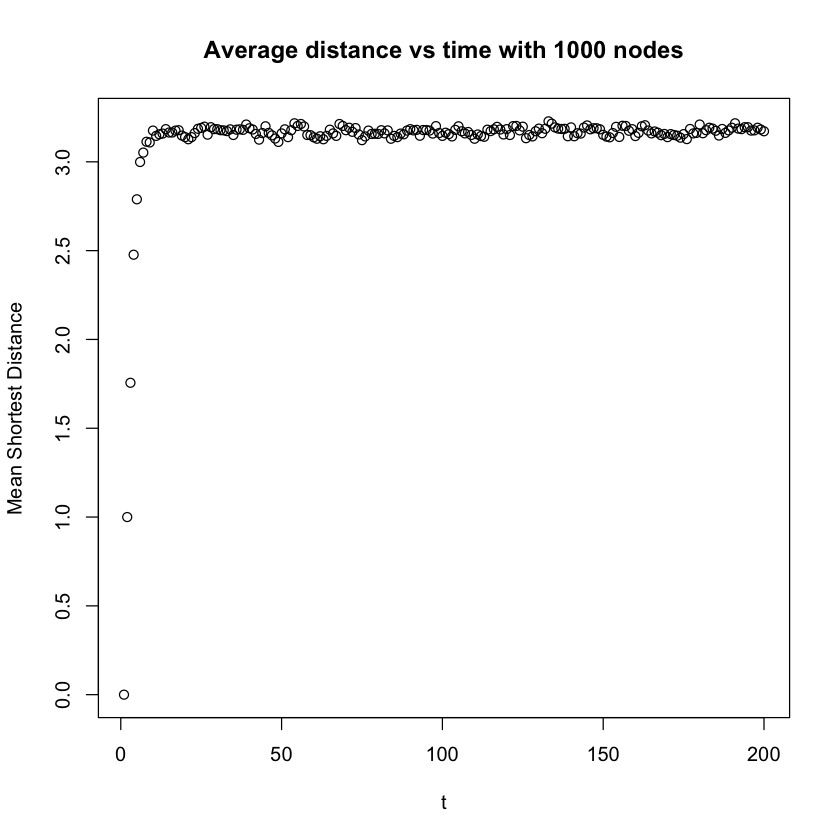

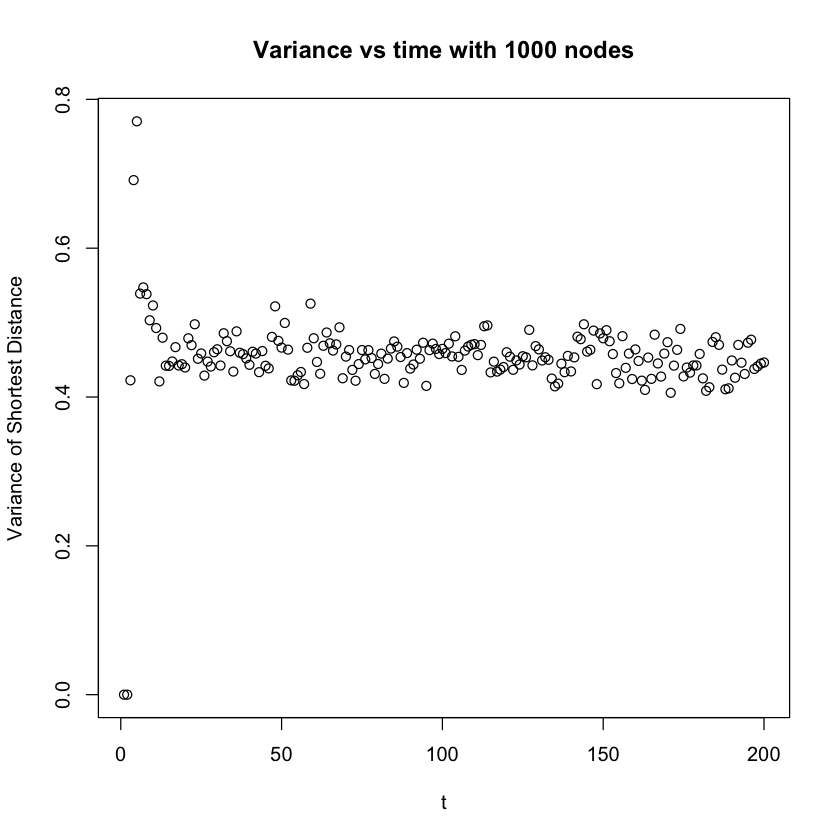

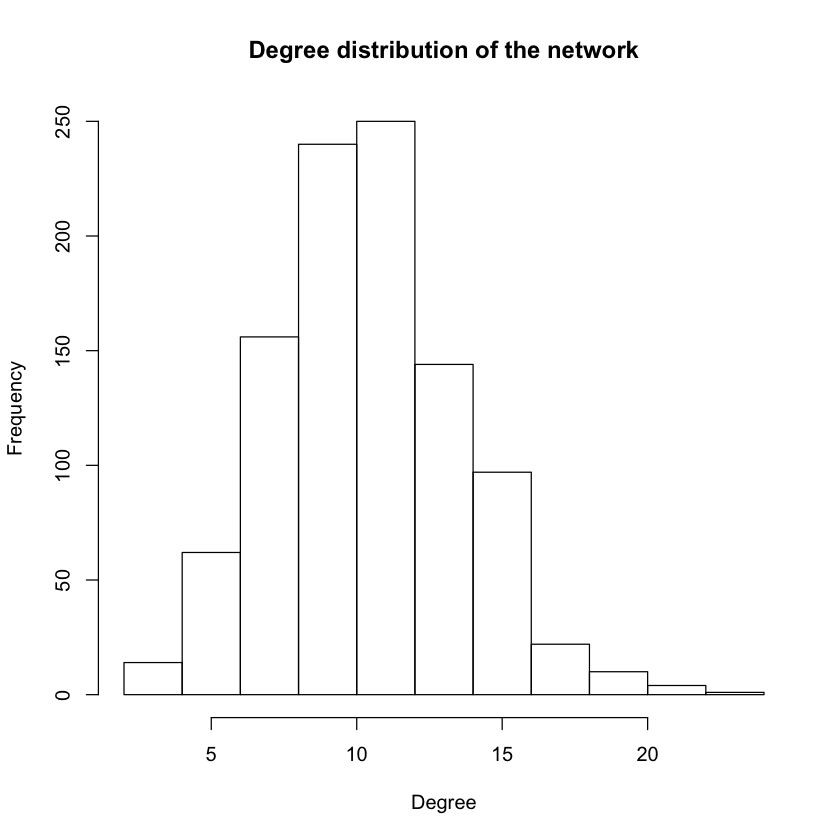

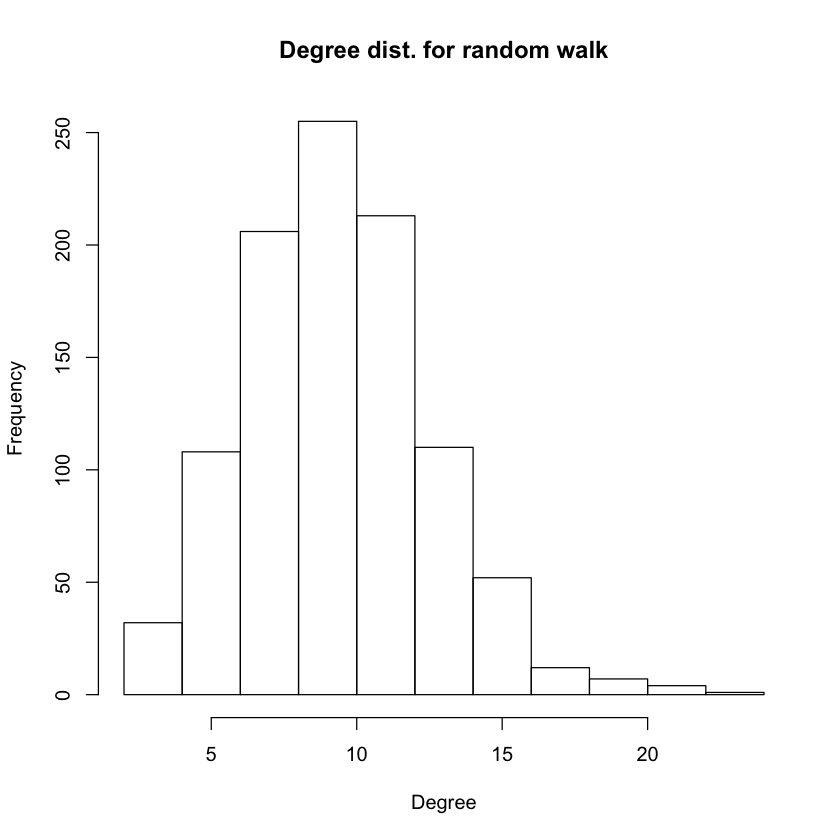

In [3]:
## Problem 2, Part 1

N = 1000
P = 0.01
NUM_STEPS = 200
NUM_TRIALS = 1000

erdos_graph = erdos.renyi.game(N, p.or.m=0.01, type="gnp")
erdos_transitions = create_transition_matrix(erdos_graph)

visit_matrix = matrix(0,NUM_TRIALS,NUM_STEPS)
for (i in 1:NUM_TRIALS) {
    visit_matrix[i,1:NUM_STEPS] = random_walk(erdos_graph, NUM_STEPS, sample(vcount(erdos_graph),1), erdos_transitions)
}

# Analyze the distance from the starting node of each step in the random walk

distance_matrix = matrix(0,NUM_TRIALS,NUM_STEPS)
shortest_path_matrix = shortest.paths(erdos_graph)

for (i in 1:NUM_TRIALS) {
    for (j in 2:NUM_STEPS) {
        distance_matrix[i,j] = shortest_path_matrix[visit_matrix[i,1],visit_matrix[i,j]]
    }
}


mean_distances = colSums(distance_matrix) / NUM_TRIALS
mean_matrix = matrix(mean_distances,nrow=NUM_TRIALS,ncol=length(mean_distances),byrow=TRUE)
variance_matrix = (distance_matrix - mean_matrix)^2
mean_variances = colSums(variance_matrix) / NUM_TRIALS

plot(mean_distances, main =paste("Average distance vs time with", N, "nodes"), xlab = "t", ylab = "Mean Shortest Distance")
plot(mean_variances, main = paste("Variance vs time with", N, "nodes"), xlab="t", ylab="Variance of Shortest Distance")

hist(degree(erdos_graph,visit_matrix[1:NUM_TRIALS,NUM_STEPS]), ,main="Degree distribution of the network",xlab="Degree",ylab="Frequency")
hist(degree(erdos_graph), main="Degree dist. for random walk", xlab="Degree",ylab="Frequency")


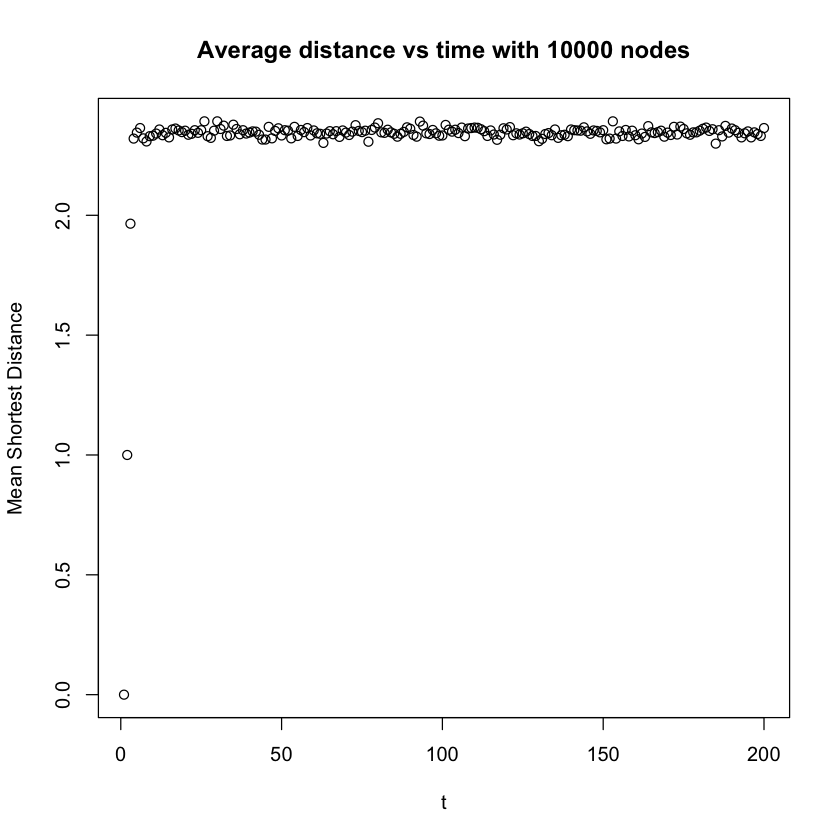

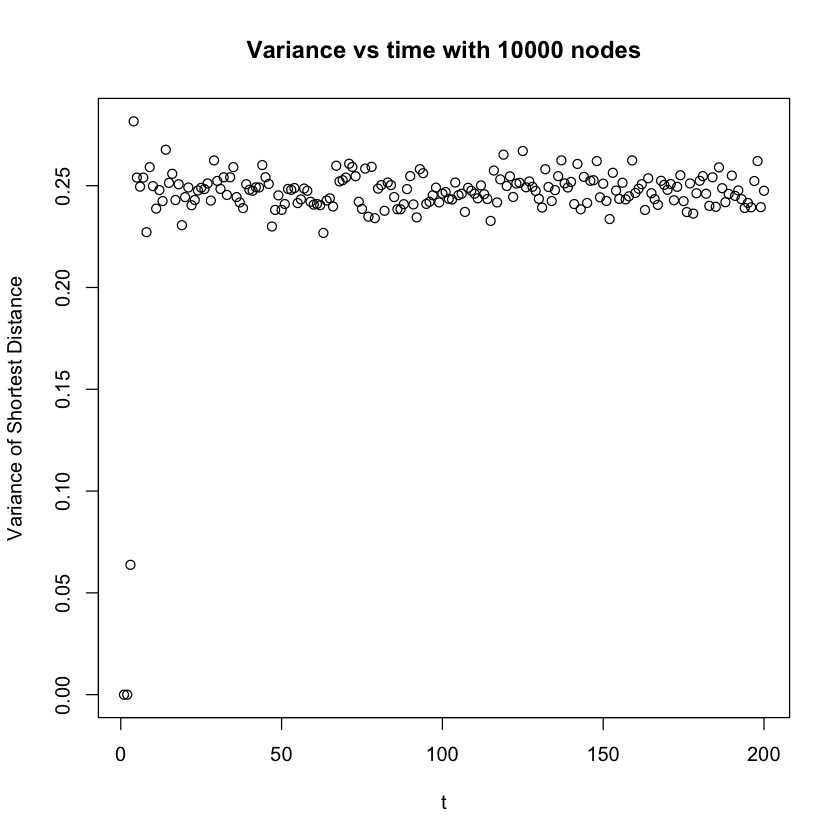

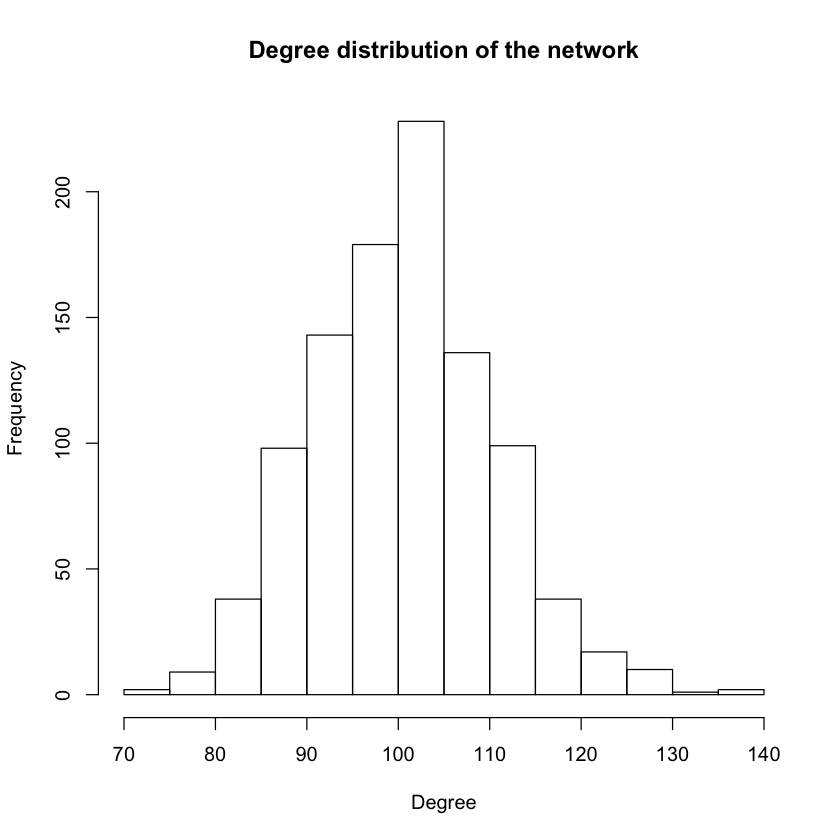

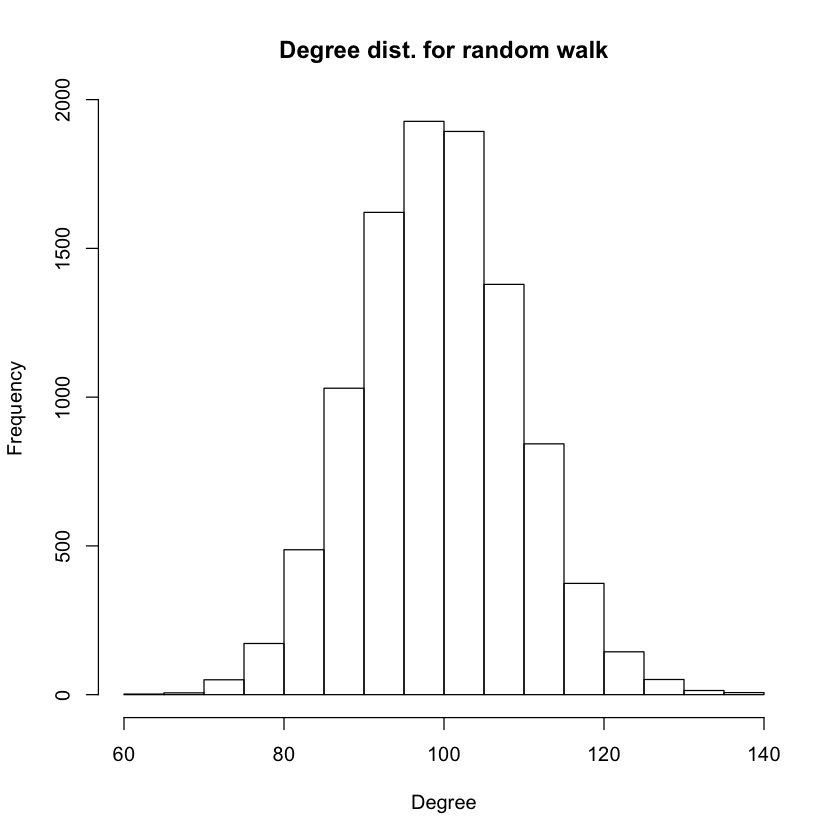

In [4]:
## Problem 2, Part 1

N = 10000
P = 0.01
NUM_STEPS = 200
NUM_TRIALS = 1000

erdos_graph = erdos.renyi.game(N, p.or.m=0.01, type="gnp")
erdos_transitions = create_transition_matrix(erdos_graph)

visit_matrix = matrix(0,NUM_TRIALS,NUM_STEPS)
for (i in 1:NUM_TRIALS) {
    visit_matrix[i,1:NUM_STEPS] = random_walk(erdos_graph, NUM_STEPS, sample(vcount(erdos_graph),1), erdos_transitions)
}

# Analyze the distance from the starting node of each step in the random walk

distance_matrix = matrix(0,NUM_TRIALS,NUM_STEPS)
shortest_path_matrix = shortest.paths(erdos_graph)

for (i in 1:NUM_TRIALS) {
    for (j in 2:NUM_STEPS) {
        distance_matrix[i,j] = shortest_path_matrix[visit_matrix[i,1],visit_matrix[i,j]]
    }
}


mean_distances = colSums(distance_matrix) / NUM_TRIALS
mean_matrix = matrix(mean_distances,nrow=NUM_TRIALS,ncol=length(mean_distances),byrow=TRUE)
variance_matrix = (distance_matrix - mean_matrix)^2
mean_variances = colSums(variance_matrix) / NUM_TRIALS

plot(mean_distances, main =paste("Average distance vs time with", N, "nodes"), xlab = "t", ylab = "Mean Shortest Distance")
plot(mean_variances, main = paste("Variance vs time with", N, "nodes"), xlab="t", ylab="Variance of Shortest Distance")

hist(degree(erdos_graph,visit_matrix[1:NUM_TRIALS,NUM_STEPS]), ,main="Degree distribution of the network",xlab="Degree",ylab="Frequency")
hist(degree(erdos_graph), main="Degree dist. for random walk", xlab="Degree",ylab="Frequency")


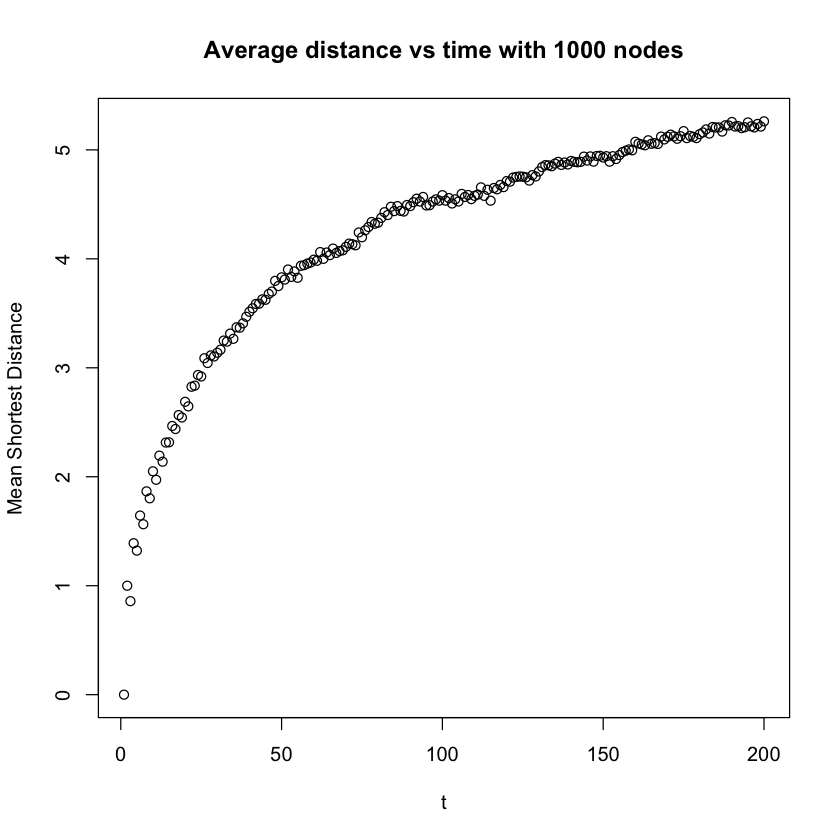

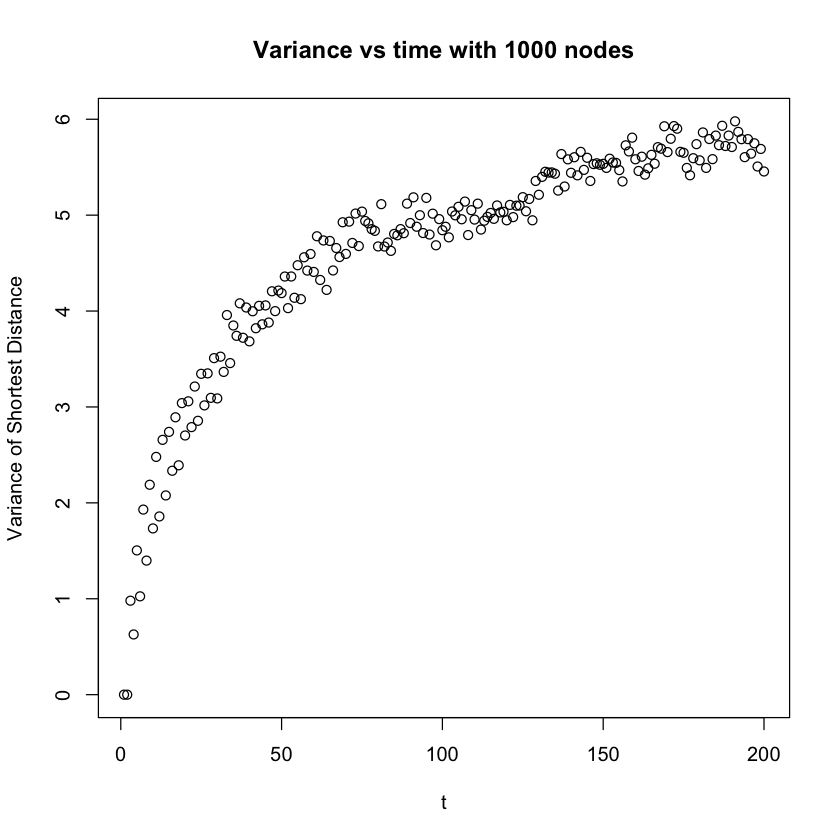

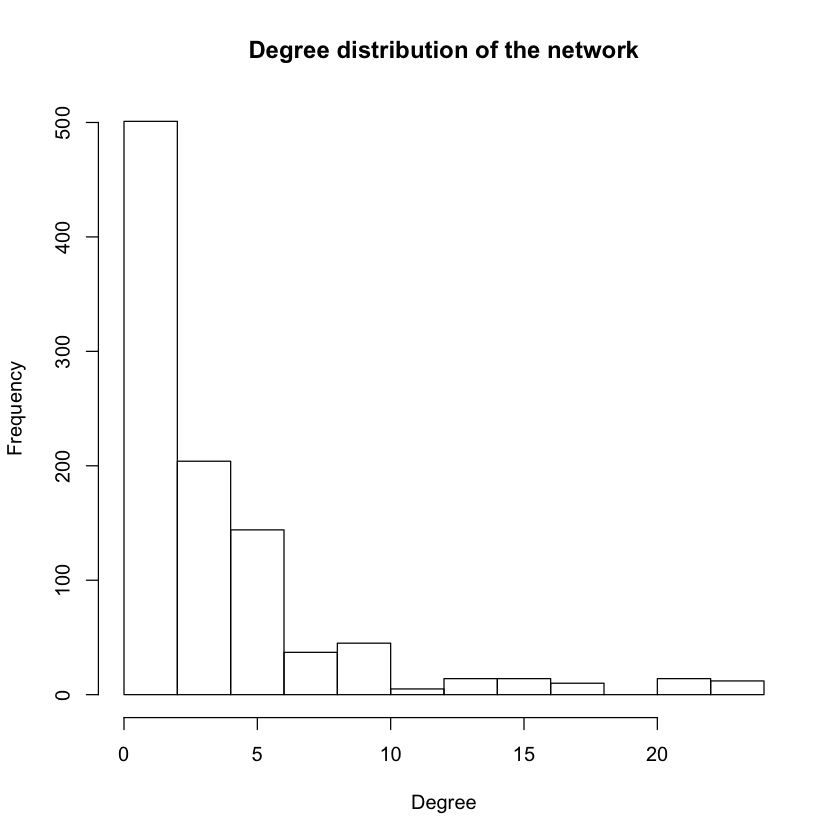

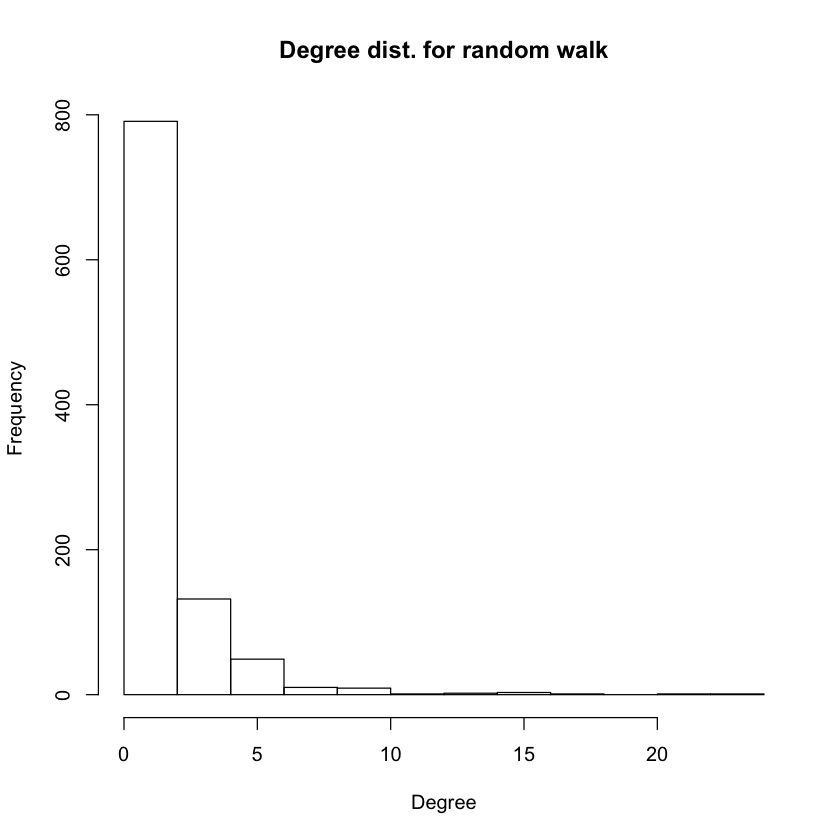

In [5]:
## Problem 2, Part 1

N = 1000
P = 0.01
NUM_STEPS = 200
NUM_TRIALS = 1000

erdos_graph = barabasi.game(N, m=1, directed=F)
erdos_transitions = create_transition_matrix(erdos_graph)

visit_matrix = matrix(0,NUM_TRIALS,NUM_STEPS)
for (i in 1:NUM_TRIALS) {
    visit_matrix[i,1:NUM_STEPS] = random_walk(erdos_graph, NUM_STEPS, sample(vcount(erdos_graph),1), erdos_transitions)
}

# Analyze the distance from the starting node of each step in the random walk

distance_matrix = matrix(0,NUM_TRIALS,NUM_STEPS)
shortest_path_matrix = shortest.paths(erdos_graph)

for (i in 1:NUM_TRIALS) {
    for (j in 2:NUM_STEPS) {
        distance_matrix[i,j] = shortest_path_matrix[visit_matrix[i,1],visit_matrix[i,j]]
    }
}


mean_distances = colSums(distance_matrix) / NUM_TRIALS
mean_matrix = matrix(mean_distances,nrow=NUM_TRIALS,ncol=length(mean_distances),byrow=TRUE)
variance_matrix = (distance_matrix - mean_matrix)^2
mean_variances = colSums(variance_matrix) / NUM_TRIALS

plot(mean_distances, main =paste("Average distance vs time with", N, "nodes"), xlab = "t", ylab = "Mean Shortest Distance")
plot(mean_variances, main = paste("Variance vs time with", N, "nodes"), xlab="t", ylab="Variance of Shortest Distance")

hist(degree(erdos_graph,visit_matrix[1:NUM_TRIALS,NUM_STEPS]), ,main="Degree distribution of the network",xlab="Degree",ylab="Frequency")
hist(degree(erdos_graph), main="Degree dist. for random walk", xlab="Degree",ylab="Frequency")


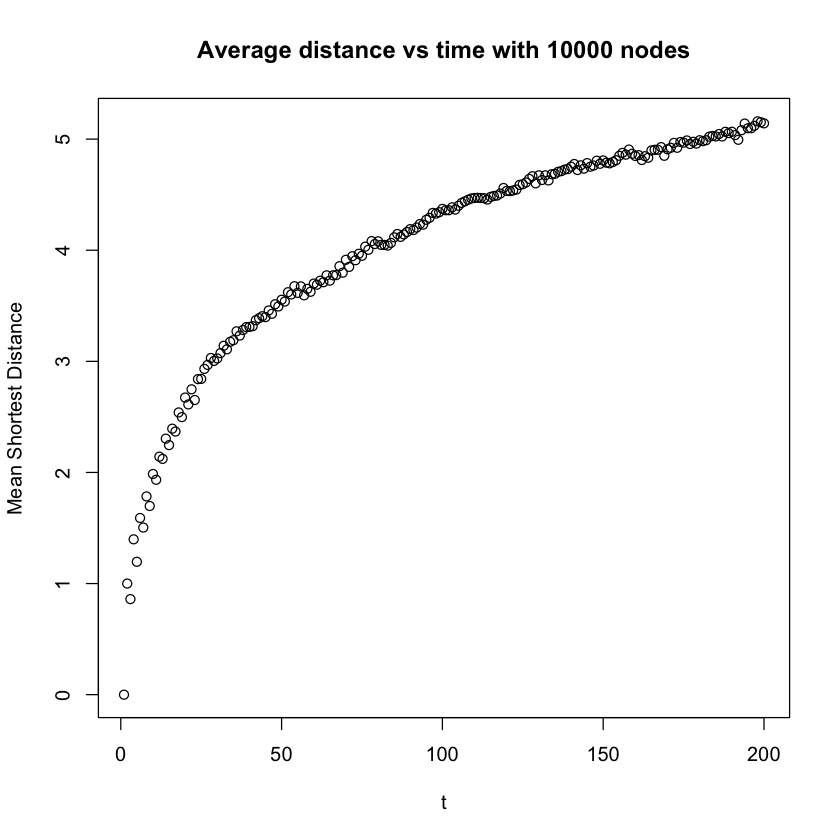

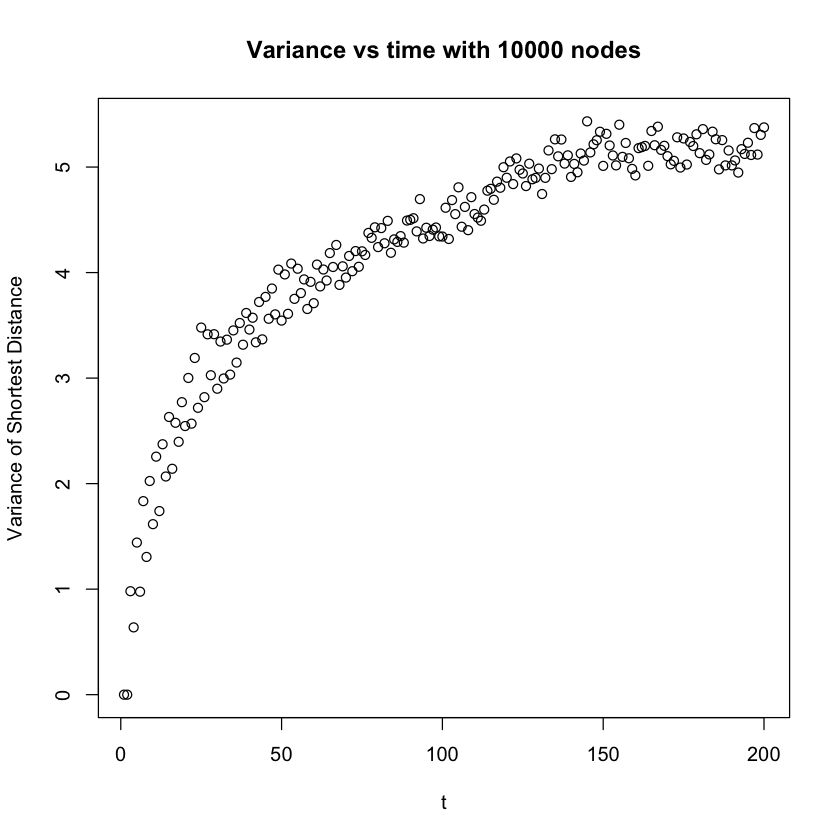

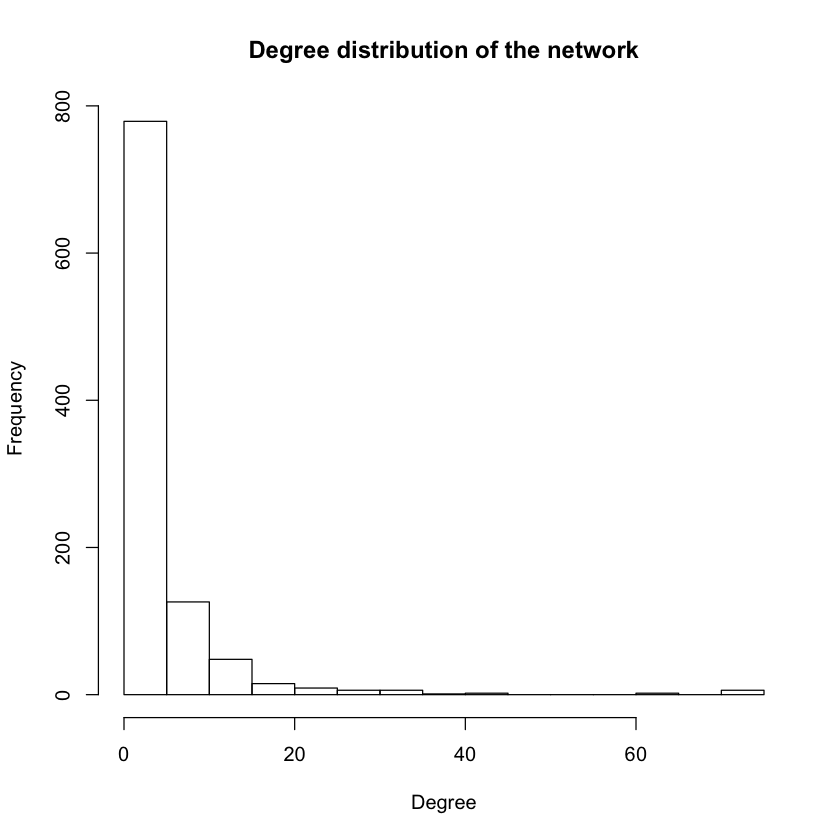

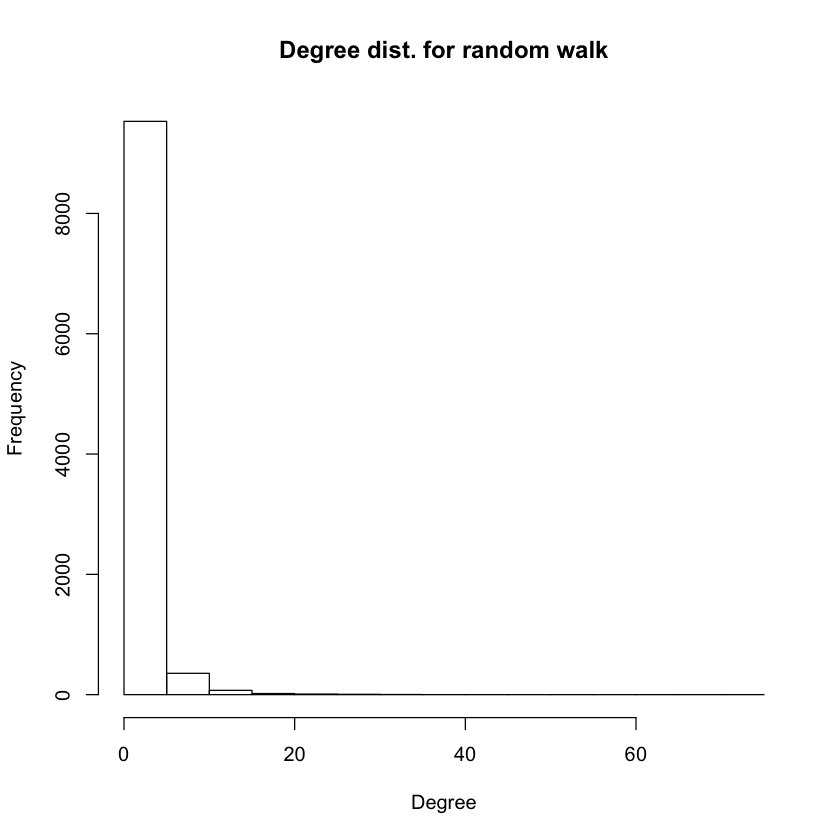

In [6]:
## Problem 2, Part 1

N = 10000
P = 0.01
NUM_STEPS = 200
NUM_TRIALS = 1000

erdos_graph = barabasi.game(N, m=1, directed=F)
erdos_transitions = create_transition_matrix(erdos_graph)

visit_matrix = matrix(0,NUM_TRIALS,NUM_STEPS)
for (i in 1:NUM_TRIALS) {
    visit_matrix[i,1:NUM_STEPS] = random_walk(erdos_graph, NUM_STEPS, sample(vcount(erdos_graph),1), erdos_transitions)
}

# Analyze the distance from the starting node of each step in the random walk

distance_matrix = matrix(0,NUM_TRIALS,NUM_STEPS)
shortest_path_matrix = shortest.paths(erdos_graph)

for (i in 1:NUM_TRIALS) {
    for (j in 2:NUM_STEPS) {
        distance_matrix[i,j] = shortest_path_matrix[visit_matrix[i,1],visit_matrix[i,j]]
    }
}


mean_distances = colSums(distance_matrix) / NUM_TRIALS
mean_matrix = matrix(mean_distances,nrow=NUM_TRIALS,ncol=length(mean_distances),byrow=TRUE)
variance_matrix = (distance_matrix - mean_matrix)^2
mean_variances = colSums(variance_matrix) / NUM_TRIALS

plot(mean_distances, main =paste("Average distance vs time with", N, "nodes"), xlab = "t", ylab = "Mean Shortest Distance")
plot(mean_variances, main = paste("Variance vs time with", N, "nodes"), xlab="t", ylab="Variance of Shortest Distance")

hist(degree(erdos_graph,visit_matrix[1:NUM_TRIALS,NUM_STEPS]), ,main="Degree distribution of the network",xlab="Degree",ylab="Frequency")
hist(degree(erdos_graph), main="Degree dist. for random walk", xlab="Degree",ylab="Frequency")


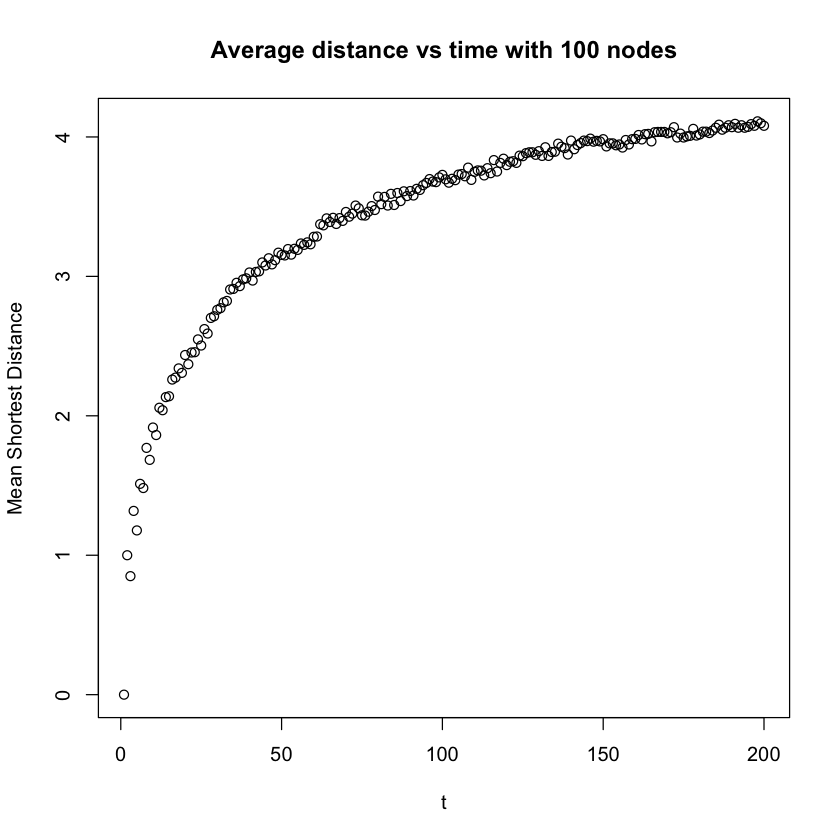

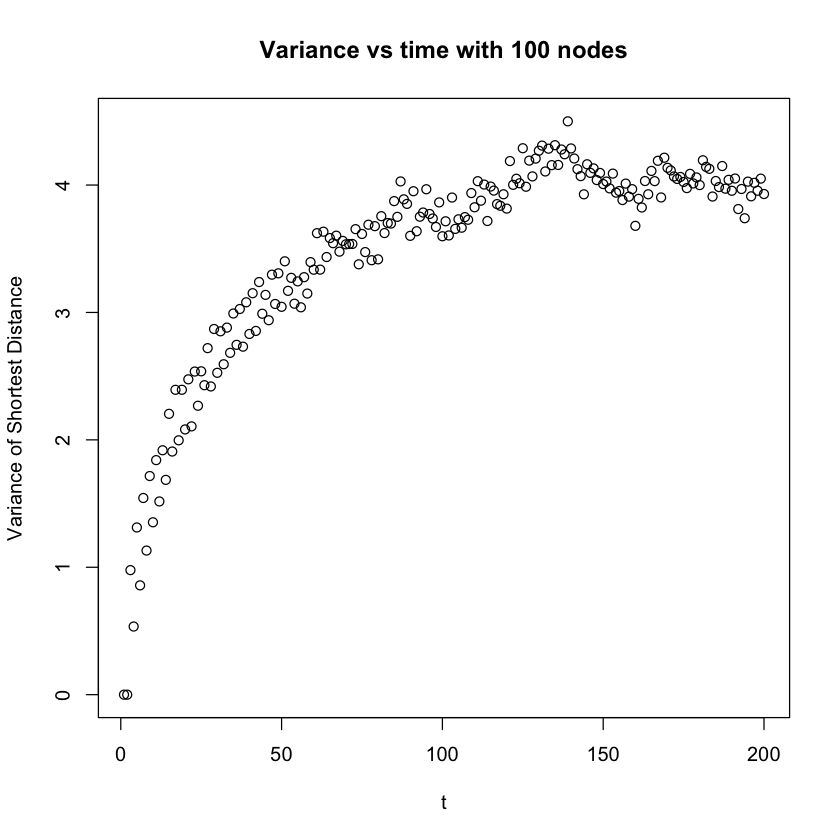

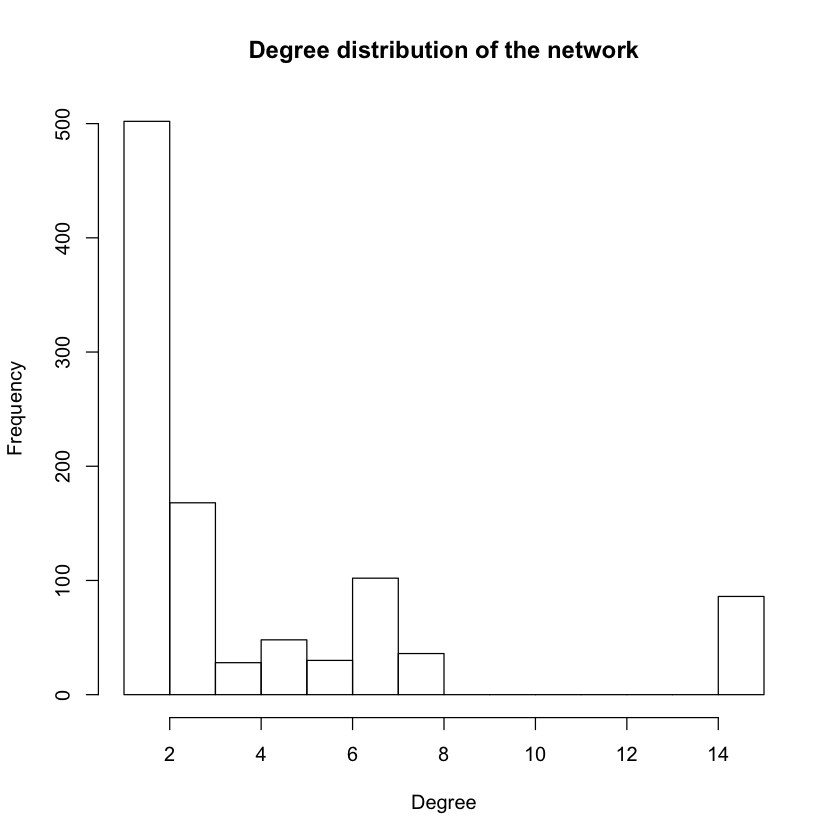

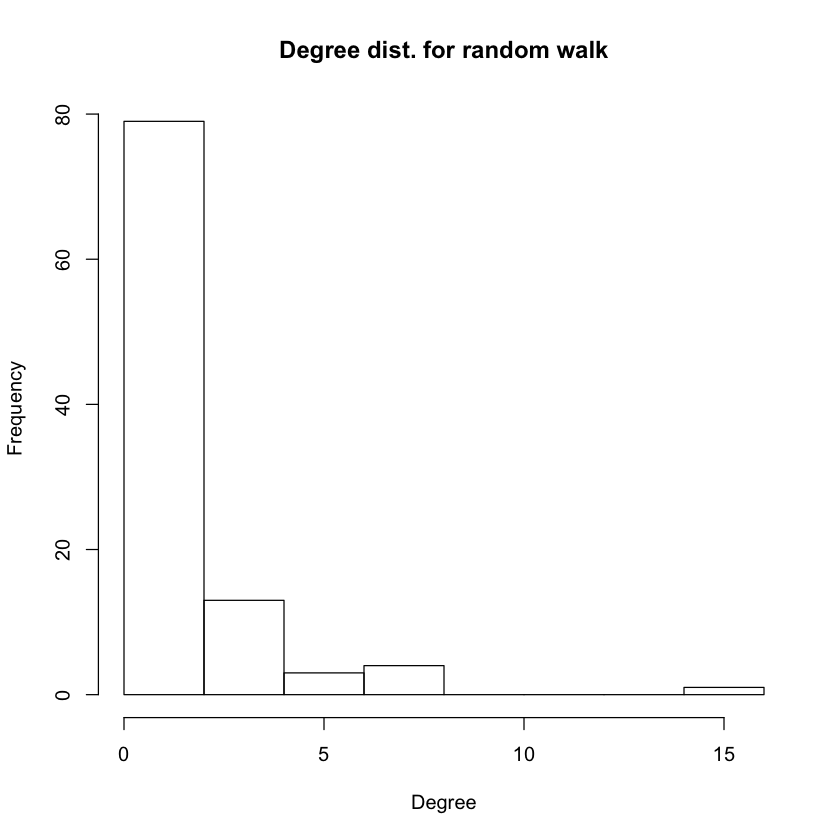

In [16]:
## Problem 2, Part 1

N = 100
P = 0.01
NUM_STEPS = 200
NUM_TRIALS = 1000

erdos_graph = barabasi.game(N, m=1, directed=F)
erdos_transitions = create_transition_matrix(erdos_graph)

visit_matrix = matrix(0,NUM_TRIALS,NUM_STEPS)
for (i in 1:NUM_TRIALS) {
    visit_matrix[i,1:NUM_STEPS] = random_walk(erdos_graph, NUM_STEPS, sample(vcount(erdos_graph),1), erdos_transitions)
}

# Analyze the distance from the starting node of each step in the random walk

distance_matrix = matrix(0,NUM_TRIALS,NUM_STEPS)
shortest_path_matrix = shortest.paths(erdos_graph)

for (i in 1:NUM_TRIALS) {
    for (j in 2:NUM_STEPS) {
        distance_matrix[i,j] = shortest_path_matrix[visit_matrix[i,1],visit_matrix[i,j]]
    }
}


mean_distances = colSums(distance_matrix) / NUM_TRIALS
mean_matrix = matrix(mean_distances,nrow=NUM_TRIALS,ncol=length(mean_distances),byrow=TRUE)
variance_matrix = (distance_matrix - mean_matrix)^2
mean_variances = colSums(variance_matrix) / NUM_TRIALS

plot(mean_distances, main =paste("Average distance vs time with", N, "nodes"), xlab = "t", ylab = "Mean Shortest Distance")
plot(mean_variances, main = paste("Variance vs time with", N, "nodes"), xlab="t", ylab="Variance of Shortest Distance")

hist(degree(erdos_graph,visit_matrix[1:NUM_TRIALS,NUM_STEPS]), ,main="Degree distribution of the network",xlab="Degree",ylab="Frequency")
hist(degree(erdos_graph), main="Degree dist. for random walk", xlab="Degree",ylab="Frequency")
